# Capstone Project 2, Data Analysis
# **Study Cases : Public Transportation Transaction Transjakarta, Apr 2023**
    Muhammad Arief Munazat
    JCDSAH 024
---

# **Problem Statement: Payment Behavior & Card Usage Analysis**

Meskipun sistem pembayaran non-tunai pada layanan transportasi telah diterapkan secara luas, pemahaman yang mendalam mengenai perilaku pembayaran dan pola penggunaan kartu oleh penumpang masih terbatas. Minimnya analisis terstruktur menyebabkan sulitnya mengidentifikasi segmentasi pengguna, preferensi metode pembayaran, serta pola perjalanan berdasarkan jenis kartu yang digunakan. Tanpa wawasan ini, perusahaan transportasi kesulitan dalam:

1. Mengoptimalkan strategi promosi berdasarkan yang relevan untuk tiap segmen pengguna. 
2. Mengidentifikasi potensi kebocoran pendapatan atau inefisiensi dalam sistem pembayaran. 
3. Merancang strategi peningkatan layanan yang berbasis data, termasuk integrasi multi-moda dan pengalaman pengguna. 
4. Memahami pola perjalanan untuk perencanaan kapasitas armada pada jam sibuk maupun non-sibuk.

Karena itu, analisis mendalam terhadap **payment behavior** dan **card usage** sangat penting untuk pengambilan keputusan strategis, peningkatan kualitas layanan, dan pengembangan kebijakan transportasi publik yang lebih efektif dan berkelanjutan.

# **Problem Scopes**
1. Dataset yang akan dilakukan analisa mengenai **Transjakarta** yang akan di export melalui csv yang dapat di akses pada link [disini](https://drive.google.com/drive/folders/1S04hk5uHfHYe6J1S6fVqDunuja1Lk1Lo)
2. Proses implementasi:
    - A. Data Loading & Understanding
    - B. Data Cleaning (missing values, outlier, data formatting, dan/atau data duplikat)
    - C. Data Analysis (statistika deskriptif / inferensial)
    - D. Data Visualization (Python & Tableau)
3. Business insight & recommendation
4. Presentation

---

## Library Import Needed

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind
import folium
from folium.plugins import HeatMap, MarkerCluster
import scipy.stats as stats
from sklearn.linear_model import LinearRegression
from scipy.stats import gaussian_kde
import plotly.graph_objects as go
from matplotlib.colors import LinearSegmentedColormap
from textwrap import wrap

import warnings
warnings.filterwarnings("ignore")

/Users/muhammada.munazat/Documents/Purwadhika_bue/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


# **Implementation Process**

--- 
## A. Data Loading & Understanding
- Data Loading and Understanding adalah tahap paling awal dalam proses analisis data atau data science.
- Tahapan ini memastikan bahwa analis (analis) benar-benar memahami dataset, struktur, dan konteksnya sebelum masuk ke pembersihan (cleaning), analisis, atau modeling.
---

### 1.A. Data Loading

In [2]:
# Load data .csv
df = pd.read_csv('transjakarta.csv')
df.info()
display(df.head(), df.tail())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37900 entries, 0 to 37899
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   transID           37900 non-null  object 
 1   payCardID         37900 non-null  int64  
 2   payCardBank       37900 non-null  object 
 3   payCardName       37900 non-null  object 
 4   payCardSex        37900 non-null  object 
 5   payCardBirthDate  37900 non-null  int64  
 6   corridorID        36643 non-null  object 
 7   corridorName      35970 non-null  object 
 8   direction         37900 non-null  float64
 9   tapInStops        36687 non-null  object 
 10  tapInStopsName    37900 non-null  object 
 11  tapInStopsLat     37900 non-null  float64
 12  tapInStopsLon     37900 non-null  float64
 13  stopStartSeq      37900 non-null  int64  
 14  tapInTime         37900 non-null  object 
 15  tapOutStops       35611 non-null  object 
 16  tapOutStopsName   36556 non-null  object

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,106.83302,13,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,106.81435,38,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,106.93526,23,2023-04-03 05:44:51,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500.0
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,106.88900,5,2023-04-03 06:17:35,P00098,Kali Besar Barat,-6.135355,106.81143,15.0,2023-04-03 06:57:03,3500.0


,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount
37895,ZWEC949B8Q87QG,4685818286724028395,brizzi,Kamila Mahendra,F,2004,6B,Ragunan - MH Thamrin via Semanggi,1.0,P00261,...,106.82309,2,2023-04-21 18:18:37,P00228,SMK 57,-6.290967,106.82365,13.0,2023-04-21 19:55:49,3500.0
37896,YHHK837P6Y95GN,6502902290603767,dki,Titi Siregar,M,1974,9N,Pinang Ranti - Pramuka,1.0,P00064,...,106.88116,1,2023-04-18 21:52:31,P00179,Pinang Ranti,-6.291075,106.88634,2.0,2023-04-18 22:28:22,3500.0
37897,YXPP627N4G95HO,213159426675861,emoney,drg. Zahra Nashiruddin,F,1976,1T,Cibubur - Balai Kota,1.0,B02873P,...,106.81676,12,2023-04-04 10:29:47,B00226P,Buperta Cibubur,-6.370321,106.89628,14.0,2023-04-04 13:27:25,20000.0
37898,RGVK175U2U98UV,377840859133591,emoney,Ana Agustina,M,1976,JAK.13,Tanah Abang - Jembatan Lima,1.0,B02505P,...,106.80954,33,2023-04-15 19:59:26,B01787P,JPO Blok G,-6.188861,106.81135,34.0,2023-04-15 20:27:50,0.0
37899,FMZZ963S4B68ZP,501862539795,flazz,drg. Leo Najmudin,F,1985,13,Ciledug - Tendean,0.0,P00001,...,106.74786,2,2023-04-12 21:08:12,P00106,Kebayoran Lama,-6.238340,106.77752,7.0,2023-04-12 21:34:53,3500.0


In [3]:
# 1st Missing Values Check
print(df.isna().sum())

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID          1257
corridorName        1930
direction              0
tapInStops          1213
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops         2289
tapOutStopsName     1344
tapOutStopsLat      1344
tapOutStopsLon      1344
stopEndSeq          1344
tapOutTime          1344
payAmount           1007
dtype: int64


### 2.A. Data Understanding
Dataset ini berisi **37.900 transaksi perjalanan** transportasi publik berbasis **tap-in dan tap-out** menggunakan kartu pembayaran. Setiap baris mewakili satu perjalanan penumpang, dengan informasi terkait **kartu, penumpang, rute, waktu, dan biaya perjalanan**.

> Beberapa kolom memiliki **missing value**, khususnya pada data rute tap-in/tap-out, koridor, dan payAmount.

#### **Kategori Informasi**
##### 1. Transaksi
* `transID` (object): ID unik setiap transaksi.
* `payAmount` (float64): Biaya perjalanan, beberapa transaksi ada yang kosong.
* `tripDuration` tidak ada langsung, tapi bisa dihitung dari `tapInTime` dan `tapOutTime`.
##### 2. Kartu & Penumpang
* `payCardID` (int64): ID unik kartu pembayaran.
* `payCardBank` (object): Bank penerbit kartu.
* `payCardName` (object): Nama pemegang kartu.
* `payCardSex` (object): Jenis kelamin.
* `payCardBirthDate` (int64): Tanggal lahir (format integer, mungkin timestamp atau YYYYMMDD).
##### 3. Rute & Koridor
* `corridorID` (object): ID koridor perjalanan (ada missing value ~1.257).
* `corridorName` (object): Nama koridor (ada missing value ~1.930).
* `direction` (float64): Arah perjalanan, bisa dikonversi ke kategori (misal 0=up,1=down).
##### 4. Tap-In (awal perjalanan)
* `tapInStops` / `tapInStopsName` (object): Stasiun/halte awal (tapInStops ada missing ~1.213, tapInStopsName lengkap).
* `tapInStopsLat` / `tapInStopsLon` (float64): Koordinat stasiun awal.
* `stopStartSeq` (int64): Urutan stop awal.
* `tapInTime` (object): Waktu tap-in, perlu dikonversi ke datetime.
##### 5. Tap-Out (akhir perjalanan)
* `tapOutStops` / `tapOutStopsName` (object): Stasiun/halte akhir (tapOutStops missing ~2.289, tapOutStopsName missing ~1.344).
* `tapOutStopsLat` / `tapOutStopsLon` (float64): Koordinat stasiun akhir (ada missing ~1.344).
* `stopEndSeq` (float64): Urutan stop akhir (ada missing ~1.344).
* `tapOutTime` (object): Waktu tap-out, perlu dikonversi ke datetime.
##### **Missing Values**
| Kolom           | Non-Null Count | Missing Value |
| --------------- | -------------- | ------------- |
| corridorID      | 36.643         | 1.257         |
| corridorName    | 35.970         | 1.930         |
| tapInStops      | 36.687         | 1.213         |
| tapOutStops     | 35.611         | 2.289         |
| tapOutStopsName | 36.556         | 1.344         |
| tapOutStopsLat  | 36.556         | 1.344         |
| tapOutStopsLon  | 36.556         | 1.344         |
| stopEndSeq      | 36.556         | 1.344         |
| payAmount       | 36.893         | 1.007         |

#### **Tipe Data**
* **Numerik**: `int64` (ID, tanggal lahir, stop sequence), `float64` (koordinat, direction, stopEndSeq, payAmount)
* **Objek/String**: `object` (ID transaksi, nama penumpang, nama bank, nama stop)
* **Beberapa kolom perlu konversi**:
  * `tapInTime` / `tapOutTime` → datetime
  * `payCardBirthDate` → datetime

#### **Insight Awal**
1. Dataset ini **tidak sepenuhnya lengkap**, beberapa kolom rute dan biaya memiliki missing value.
2. Data memungkinkan analisis:
   * **Perilaku pembayaran** (payAmount, bank, usia, jenis kelamin)
   * **Rute populer & arah perjalanan** (corridorID, direction, tapIn/tapOut stops)
   * **Durasi perjalanan** (dihitung dari tapInTime dan tapOutTime)
   * **Analisis geografis** (koordinat stasiun untuk peta dan flow perjalanan).
---

---
## B. Data Cleaning & Transforming
---

**1. Data Cleaning (Pembersihan Data)**

Fokus pada memperbaiki kualitas data agar **valid**, **bersih**, dan **layak dianalisis**.

**Aktivitas yang termasuk data cleaning:**

* Menghapus duplikat
* Menangani missing values
* Memperbaiki format (tanggal, angka, string)
* Menstandarisasi nama kolom
* Menghapus outlier yang tidak logis
* Memperbaiki kategori yang salah ketik

> **Tujuan:** data menjadi akurat, konsisten, dan bebas error.

**2. Data Transformation (Transformasi Data)**

Fokus pada mengubah bentuk, struktur, atau format data agar lebih siap digunakan untuk **analisis lanjutan** atau **modeling**.

Transformasi tidak selalu untuk memperbaiki data, tetapi untuk membuat data **lebih berguna**.

**Aktivitas yang termasuk data transforming:**

* Normalisasi atau standardisasi nilai numerik
* Encoding kategori (misal: one-hot encoding)
* Feature engineering (contoh: membuat kolom baru seperti `trip_duration`)
* Aggregation (mengelompokkan dan menghitung summary)
* Filtering & subsetting
* Pivot & melt (reshape data)
* Konversi tipe data (misal: int → float, object → datetime)
* Mapping value kategori (contoh: “dki” → “DKI”)

> **Tujuan:** membuat data siap untuk dianalisis atau digunakan dalam model machine learning.

**3. Hubungan Keduanya**

| Aspek  | Data Cleaning           | Data Transforming                   |
| ------ | ----------------------- | ----------------------------------- |
| Fokus  | memperbaiki             | mengubah                            |
| Tujuan | kualitas data           | kegunaan data                       |
| Contoh | hilangkan missing       | buat kolom baru (durasi perjalanan) |
| Urutan | biasanya dilakukan dulu | dilakukan setelah cleaning          |

> **Kesimpulan:** proses yang benar mengikuti urutan **Data Cleaning → Data Transformation**.


### 1.A. Data Cleaning

#### Standardisasi Format Teks (String Cleansing) pada **payCardBank**
Tujuan:
- Menyamakan format penulisan nama bank agar konsisten.
- Menghindari analisis salah akibat penulisan berbeda (contoh: BCA, bca, Bca dianggap berbeda).
- Memastikan bank tertentu seperti DKI mengikuti format khusus (uppercase).
> Dampak: kategori menjadi lebih akurat dan mudah di-grouping saat analisis.

In [4]:
df['payCardBank'] = (
    df['payCardBank']
    .astype(str)
    .str.strip()
    .str.lower()
    .str.capitalize()
)

# Khusus bank DKI harus uppercase
df['payCardBank'] = df['payCardBank'].replace({"Dki": "DKI"})

#### Membersihkan Format Kolom String
Tujuan:
- Menghapus spasi di awal/akhir.
- Mengatasi data error saat grouping ("DKI" ≠ "DKI ").
- Menghindari misleading.

In [5]:
string_cols = [
    'payCardBank','payCardName','payCardSex',
    'corridorID','corridorName','tapInStops',
    'tapInStopsName','tapOutStops','tapOutStopsName'
]

for col in string_cols:
    df[col] = df[col].astype(str).str.strip()

#### Cleaning Kolom Tahun Lahir
Tujuan:
- Untuk pastikan kolom hanya angka.
- Bersihkan tahun lahir tidak logis.
- Hitung usia sebagai variabel baru.
- Hapus outlier usia tidak mungkin (5–100 tahun).

In [6]:
df['payCardBirthDate'] = df['payCardBirthDate'].astype(int) # Rubah ke int.
print(df['payCardBirthDate'].dtype)

int64


In [7]:
from narwhals import Int64

df['payCardBirthDate'] = pd.to_numeric(df['payCardBirthDate'], errors='coerce')

df.loc[
    (df['payCardBirthDate'] < 1920) | 
    (df['payCardBirthDate'] > 2020),
    'payCardBirthDate'
] = np.nan

current_year = pd.Timestamp.today().year
df['age'] = current_year - df['payCardBirthDate']

df = df[(df['age'] >= 5) & (df['age'] <= 100)]

# Jadikan kembali int
df['payCardBirthDate'] = df['payCardBirthDate'].astype('Int64')  # nullable int
df['age'] = df['age'].astype('Int64')

print(df[['payCardBirthDate','age']].dtypes)

payCardBirthDate    Int64
age                 Int64
dtype: object


#### Konversi waktu Tap-in & Tap-out ke datetime pada kolom **tapInTime** & **tapOutTime**
Tujuan:
- Agar bisa dihitung durasi perjalanan.
- Bisa diekstrak jam, hari, tanggal.
- Dapat diurutkan berdasarkan waktu.
- Menjamin format waktu bersih dan tidak error.

In [8]:
df['tapInTime'] = pd.to_datetime(df['tapInTime'], errors='coerce')
df['tapOutTime'] = pd.to_datetime(df['tapOutTime'], errors='coerce')

#### Memperbaiki kategori (bank, gender)
Tujuan:
- Menyatukan kategori bank yang salah eja.
- Standarisasi gender (MALE/FEMALE).

Tanpa cleaning:
- “dki”, “DKI”, “Bank DKI”, “D K I” dianggap berbeda → salah hitung pangsa bank.
- Gender “L” dan “P” (Laki-laki, Perempuan) tidak dikenali oleh model.

“PayCardBank” penting untuk insight:
- Bank mana yang paling banyak dipakai
- Segmentasi pelanggan berdasarkan kartu bank

In [9]:
df['payCardBank'] = df['payCardBank'].str.lower().str.replace(' ', '')
df['payCardBank'] = df['payCardBank'].replace({
    'dki': 'DKI', 'bankdki': 'DKI'
})
df['payCardBank'] = df['payCardBank'].str.capitalize()
df.loc[df['payCardBank'] == 'Dki', 'payCardBank'] = 'DKI'
df.loc[df['payCardBank'] == 'Bni', 'payCardBank'] = 'BNI'

df['payCardSex'] = df['payCardSex'].str.upper()
df['payCardSex'] = df['payCardSex'].replace({
    'M': 'Male', 'L': 'Male',
    'F': 'Female', 'P': 'Female'
})

#### Menambahkan Group berdasarkan rentang umur
Tujuan:
- Untuk menyatukan kategori umur berdasarkan termuda dan tertua

In [10]:

# Memastikan payCardBirthDate berupa angka (tahun lahir)
df['payCardBirthDate'] = pd.to_numeric(df['payCardBirthDate'], errors='coerce')

# Cleaning tahun lahir abnormal
df.loc[
    (df['payCardBirthDate'] < 1920) | 
    (df['payCardBirthDate'] > 2020),
    'payCardBirthDate'] = np.nan

# Hitung usia
current_year = pd.Timestamp.today().year
df['age'] = current_year - df['payCardBirthDate']

# Buat 4 kategori umur

bins = [0, 24, 44, 64, 200]
labels = ["Young", "Adult", "Middle-Aged", "Senior"]
df['age_group_4'] = pd.cut(df['age'], bins=bins, labels=labels, right=True)


print(df[['payCardBirthDate', 'age', 'age_group_4']].head())
print(df[['payCardBirthDate', 'age', 'age_group_4']].dtypes)


   payCardBirthDate  age  age_group_4
0              2008   17        Young
1              1997   28        Adult
2              1992   33        Adult
3              1978   47  Middle-Aged
4              1982   43        Adult
payCardBirthDate       Int64
age                    Int64
age_group_4         category
dtype: object


#### Outlier Detection & Removal
Tujuan:
- Pastikan koordinat berada di area Jakarta.
- Pastikan tarif tidak aneh (normal 0–5000, tetapi beri toleransi 50k).

Jika tidak dibersihkan:
- Ada titik koordinat error yang bikin peta rusak.
- Ada nilai tarif 1 juta / negatif / 0.01 yang merusak perhitungan revenue.

Setelah outlier dibuang:
- Heatmap halte lebih akurat
- Analisis perjalanan tidak bias
- Perhitungan pendapatan lebih realistis

In [11]:
df = df[
    (df['tapInStopsLat'].between(-7, -5)) &
    (df['tapInStopsLon'].between(106, 107)) &
    (df['tapOutStopsLat'].between(-7, -5)) &
    (df['tapOutStopsLon'].between(106, 107))
]

df = df[df['payAmount'].between(0, 50000)]

#### Bus Stop coordinate cleaning
Tujuan:
- Menghapus atau mengganti koordinat tidak valid (0 atau NaN).
- Menjamin akurasi ketika ingin membuat peta, heatmap, atau geospatial analysis.
- Mencegah mapping error karena titik yang tidak sesuai.

In [12]:
def clean_coords(col):
    df[col] = df[col].replace({0: np.nan})
    return df

for col in ['tapInStopsLat', 'tapInStopsLon', 'tapOutStopsLat', 'tapOutStopsLon']:
    clean_coords(col)

#### Handling missing values
1. corridorID dan corridorName missing → diberi flag, dengan tujuan:
    - Tidak menghapus data, tetapi memberi indikator bahwa data rute tidak tercatat.
    - Memungkinkan analisis tentang seberapa sering sistem tidak mencatat rute.
2. Tap-out missing → diberi flag, dengan tujuan:
    - Pada TransJakarta, data tap-out sering hilang.
    - Flag penting untuk:
        - Mengetahui perilaku penumpang,
        - Menghitung error sistem,
        - Menandai data yang tidak bisa dihitung durasinya.
3. payAmount missing → isi dengan tarif standar 3500, karena:
    - Tarif TransJakarta bersifat flat, sehingga aman untuk imputasi.
    - Menjaga agar kolom payAmount tidak kosong.

> Ini penting jika ingin analisis lengkap.

In [13]:
# Missing corridorID & corridorName
df['corridorID_missing'] = df['corridorID'].isna().astype(int)
df['corridorName_missing'] = df['corridorName'].isna().astype(int)

# Missing tapOut 
df['tapOutMissing'] = df['tapOutTime'].isna().astype(int)

# Missing payAmount
df['payAmount'] = df['payAmount'].fillna(3500)


#### Menghapus baris duplikat
Tujuan:
- Menghindari analisis yang tidak tepat karena data tercatat dua kali.
- Menjaga agar jumlah penumpang, total transaksi, dan statistik lainnya akurat.

In [14]:
df = df.drop_duplicates()

#### Reset index
Tujuan:
- Membersihkan index agar rapi setelah filtering.
- Penting saat menyimpan ke CSV atau visualisasi.

In [15]:
df = df.reset_index(drop=True)

In [16]:
# 2nd Missing Values & Data Info Check
df.info()
display(df.head(), df.tail())
print(df.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35280 entries, 0 to 35279
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   transID               35280 non-null  object        
 1   payCardID             35280 non-null  int64         
 2   payCardBank           35280 non-null  object        
 3   payCardName           35280 non-null  object        
 4   payCardSex            35280 non-null  object        
 5   payCardBirthDate      35280 non-null  Int64         
 6   corridorID            35280 non-null  object        
 7   corridorName          35280 non-null  object        
 8   direction             35280 non-null  float64       
 9   tapInStops            35280 non-null  object        
 10  tapInStopsName        35280 non-null  object        
 11  tapInStopsLat         35280 non-null  float64       
 12  tapInStopsLon         35280 non-null  float64       
 13  stopStartSeq    

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,age,age_group_4,corridorID_missing,corridorName_missing,tapOutMissing
0,EIIW227B8L34VB,180062659848800,Emoney,Bajragin Usada,Male,2008,5,Matraman Baru - Ancol,1.0,P00142,...,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0,17,Young,0,0,0
1,LGXO740D2N47GZ,4885331907664776,DKI,Gandi Widodo,Female,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0,28,Adult,0,0,0
2,DJWR385V2U57TO,4996225095064169,DKI,Emong Wastuti,Female,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0,33,Adult,0,0,0
3,JTUZ800U7C86EH,639099174703,Flazz,Surya Wacana,Female,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500.0,47,Middle-Aged,0,0,0
4,VMLO535V7F95NJ,570928206772,Flazz,Embuh Mardhiyah,Male,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,-6.135355,106.81143,15.0,2023-04-03 06:57:03,3500.0,43,Adult,0,0,0


,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,age,age_group_4,corridorID_missing,corridorName_missing,tapOutMissing
35275,ZWEC949B8Q87QG,4685818286724028395,Brizzi,Kamila Mahendra,Female,2004,6B,Ragunan - MH Thamrin via Semanggi,1.0,P00261,...,-6.290967,106.82365,13.0,2023-04-21 19:55:49,3500.0,21,Young,0,0,0
35276,YHHK837P6Y95GN,6502902290603767,DKI,Titi Siregar,Male,1974,9N,Pinang Ranti - Pramuka,1.0,P00064,...,-6.291075,106.88634,2.0,2023-04-18 22:28:22,3500.0,51,Middle-Aged,0,0,0
35277,YXPP627N4G95HO,213159426675861,Emoney,drg. Zahra Nashiruddin,Female,1976,1T,Cibubur - Balai Kota,1.0,B02873P,...,-6.370321,106.89628,14.0,2023-04-04 13:27:25,20000.0,49,Middle-Aged,0,0,0
35278,RGVK175U2U98UV,377840859133591,Emoney,Ana Agustina,Male,1976,JAK.13,Tanah Abang - Jembatan Lima,1.0,B02505P,...,-6.188861,106.81135,34.0,2023-04-15 20:27:50,0.0,49,Middle-Aged,0,0,0
35279,FMZZ963S4B68ZP,501862539795,Flazz,drg. Leo Najmudin,Female,1985,13,Ciledug - Tendean,0.0,P00001,...,-6.238340,106.77752,7.0,2023-04-12 21:34:53,3500.0,40,Adult,0,0,0


transID                 0
payCardID               0
payCardBank             0
payCardName             0
payCardSex              0
payCardBirthDate        0
corridorID              0
corridorName            0
direction               0
tapInStops              0
tapInStopsName          0
tapInStopsLat           0
tapInStopsLon           0
stopStartSeq            0
tapInTime               0
tapOutStops             0
tapOutStopsName         0
tapOutStopsLat          0
tapOutStopsLon          0
stopEndSeq              0
tapOutTime              0
payAmount               0
age                     0
age_group_4             0
corridorID_missing      0
corridorName_missing    0
tapOutMissing           0
dtype: int64


### Data Summary After Cleaning
#### 1. Dataset Structure
- Total rows: 35,280  
- Total columns: 26  
- Memory usage: approximately 7.0 MB  
> The dataset is now streamlined and prepared for analytical workflows.

#### 2. Missing Values Status
All columns show zero missing values (`df.isna().sum()`), indicating:
- All incomplete records have been removed or addressed.
- The dataset is fully complete with no null values.
- Indicator columns (`corridorID_missing`, `corridorName_missing`, `tapOutMissing`) remain as binary flags to reflect original missingness patterns.

#### 3. Data Type Validation
##### Datetime Fields
- `tapInTime`: datetime64  
- `tapOutTime`: datetime64  
> These fields are properly formatted for time-based calculations such as duration analysis.
##### Numerical Fields
- Float columns: coordinates, payment value, age, and sequence indicators  
- Integer columns: identifiers and missing-value flags  
##### Categorical/Object Fields
- Passenger attributes: `payCardName`, `payCardBank`, `payCardSex`  
- Route details: `corridorID`, `corridorName`  
- Stop information: `tapInStops`, `tapInStopsName`, `tapOutStops`, `tapOutStopsName`  
> All fields are in appropriate formats for grouping, aggregation, and categorical analysis.

#### 4. Engineered Columns
The dataset now includes additional engineered features:
1. `age`  
   Derived from `payCardBirthDate` to represent actual passenger age.

2. `corridorID_missing`  
3. `corridorName_missing`  
4. `tapOutMissing`  
   Binary diagnostic colu


### 1.B. Data Transforming

#### Membuat kolom usia
Tujuan:
- Menganalisis profil penumpang berdasarkan umur.
- Mengetahui segmen pengguna:
    - Anak-anak, remaja, dewasa, lansia.
- Membuat category grouping untuk analisis demografi.

> Data umur sangat penting untuk keputusan bisnis layanan transportasi.

In [17]:
import datetime

# Ambil tahun sekarang secara otomatis
current_year = datetime.datetime.now().year
# Pastikan kolom tahun lahir berbentuk numerik
df['payCardBirthDate'] = pd.to_numeric(df['payCardBirthDate'], errors='coerce')
# Buat kolom usia
df['age'] = current_year - df['payCardBirthDate']


#### Membuat Durasi Perjalanan (trip duration)
Tujuan:
- Mengetahui berapa lama rata-rata perjalanan per corridor.
- Mengukur efisiensi rute.
- Bisa digunakan untuk analisis jam sibuk (rush hour).
- Berguna untuk modeling/anomaly detection jika durasi terlalu lama.

> Ini adalah fitur paling penting pada kasus transportasi.

In [18]:
df['trip_duration_minutes'] = (df['tapOutTime'] - df['tapInTime']).dt.total_seconds() / 60

#### Ekstraksi Hari, Jam, dan Tanggal perjalanan
Tujuan:
- Mengetahui pola penggunaan bus TransJakarta, seperti:
    - Kapan paling ramai?
    - Jam berapa puncaknya?
    - Hari apa paling sepi?
- Berguna untuk forecasting demand dan perencanaan operasional.

In [19]:
df['day_of_week'] = df['tapInTime'].dt.day_name()
df['hour_of_day'] = df['tapInTime'].dt.hour
df['date'] = df['tapInTime'].dt.date

#### Membuat label waktu (Time Period)
Tujuan:
- Menyederhanakan analisis dibandingkan menggunakan angka jam.
- Mempermudah dashboard dan visualisasi.
- Dipakai untuk melihat tren waktu dengan cara yang lebih mudah dipahami.

In [20]:
def time_label(hour):
    if 5 <= hour < 10: return "Pagi"
    elif 10 <= hour < 15: return "Siang"
    elif 15 <= hour < 19: return "Sore"
    else: return "Malam"

df['time_period'] = df['hour_of_day'].apply(time_label)

#### Membuat Pasangan Koordinat (tapInCoord dan tapOutCoord)
Tujuan:
- Mempermudah visualisasi rute perjalanan dalam bentuk peta.
- Memudahkan mapping titik awal dan akhir perjalanan.
- Berguna untuk membuat heatmap mobilitas penduduk Jakarta.

In [21]:
df['tapInCoord'] = list(zip(df['tapInStopsLat'], df['tapInStopsLon']))
df['tapOutCoord'] = list(zip(df['tapOutStopsLat'], df['tapOutStopsLon']))

In [22]:
# 3rd Missing Values & Data Info Check
df.info()
display(df.head(), df.tail())
print(df.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35280 entries, 0 to 35279
Data columns (total 34 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   transID                35280 non-null  object        
 1   payCardID              35280 non-null  int64         
 2   payCardBank            35280 non-null  object        
 3   payCardName            35280 non-null  object        
 4   payCardSex             35280 non-null  object        
 5   payCardBirthDate       35280 non-null  Int64         
 6   corridorID             35280 non-null  object        
 7   corridorName           35280 non-null  object        
 8   direction              35280 non-null  float64       
 9   tapInStops             35280 non-null  object        
 10  tapInStopsName         35280 non-null  object        
 11  tapInStopsLat          35280 non-null  float64       
 12  tapInStopsLon          35280 non-null  float64       
 13  s

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,corridorID_missing,corridorName_missing,tapOutMissing,trip_duration_minutes,day_of_week,hour_of_day,date,time_period,tapInCoord,tapOutCoord
0,EIIW227B8L34VB,180062659848800,Emoney,Bajragin Usada,Male,2008,5,Matraman Baru - Ancol,1.0,P00142,...,0,0,0,39.150000,Monday,5,2023-04-03,Pagi,"(-6.184631, 106.84402)","(-6.203101, 106.85715)"
1,LGXO740D2N47GZ,4885331907664776,DKI,Gandi Widodo,Female,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,0,0,0,57.283333,Monday,5,2023-04-03,Pagi,"(-6.2287, 106.83302)","(-6.217152, 106.81892)"
2,DJWR385V2U57TO,4996225095064169,DKI,Emong Wastuti,Female,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,0,0,0,51.816667,Monday,5,2023-04-03,Pagi,"(-6.133132, 106.81435)","(-6.133731, 106.81475)"
3,JTUZ800U7C86EH,639099174703,Flazz,Surya Wacana,Female,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,0,0,0,43.416667,Monday,5,2023-04-03,Pagi,"(-6.195743, 106.93526)","(-6.183068, 106.93194)"
4,VMLO535V7F95NJ,570928206772,Flazz,Embuh Mardhiyah,Male,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,0,0,0,39.466667,Monday,6,2023-04-03,Pagi,"(-6.14965, 106.889)","(-6.135355, 106.81143)"


,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,corridorID_missing,corridorName_missing,tapOutMissing,trip_duration_minutes,day_of_week,hour_of_day,date,time_period,tapInCoord,tapOutCoord
35275,ZWEC949B8Q87QG,4685818286724028395,Brizzi,Kamila Mahendra,Female,2004,6B,Ragunan - MH Thamrin via Semanggi,1.0,P00261,...,0,0,0,97.200000,Friday,18,2023-04-21,Sore,"(-6.196892, 106.82309)","(-6.290967, 106.82365)"
35276,YHHK837P6Y95GN,6502902290603767,DKI,Titi Siregar,Male,1974,9N,Pinang Ranti - Pramuka,1.0,P00064,...,0,0,0,35.850000,Tuesday,21,2023-04-18,Malam,"(-6.290154, 106.88116)","(-6.291075, 106.88634)"
35277,YXPP627N4G95HO,213159426675861,Emoney,drg. Zahra Nashiruddin,Female,1976,1T,Cibubur - Balai Kota,1.0,B02873P,...,0,0,0,177.633333,Tuesday,10,2023-04-04,Siang,"(-6.216247, 106.81676)","(-6.370321, 106.89628)"
35278,RGVK175U2U98UV,377840859133591,Emoney,Ana Agustina,Male,1976,JAK.13,Tanah Abang - Jembatan Lima,1.0,B02505P,...,0,0,0,28.400000,Saturday,19,2023-04-15,Malam,"(-6.188656, 106.80954)","(-6.188861, 106.81135)"
35279,FMZZ963S4B68ZP,501862539795,Flazz,drg. Leo Najmudin,Female,1985,13,Ciledug - Tendean,0.0,P00001,...,0,0,0,26.683333,Wednesday,21,2023-04-12,Malam,"(-6.236466, 106.74786)","(-6.23834, 106.77752)"


transID                  0
payCardID                0
payCardBank              0
payCardName              0
payCardSex               0
payCardBirthDate         0
corridorID               0
corridorName             0
direction                0
tapInStops               0
tapInStopsName           0
tapInStopsLat            0
tapInStopsLon            0
stopStartSeq             0
tapInTime                0
tapOutStops              0
tapOutStopsName          0
tapOutStopsLat           0
tapOutStopsLon           0
stopEndSeq               0
tapOutTime               0
payAmount                0
age                      0
age_group_4              0
corridorID_missing       0
corridorName_missing     0
tapOutMissing            0
trip_duration_minutes    0
day_of_week              0
hour_of_day              0
date                     0
time_period              0
tapInCoord               0
tapOutCoord              0
dtype: int64


### Post-Cleaning Data Summary
#### 1. Dataset Structure
- The dataset contains **35,280 rows and 34 columns** after the cleaning and transformation processes.  
- Memory usage is approximately **8.8 MB**, which remains efficient despite the added engineered features.
> Overall, the dataset is now consistent and ready for further analysis.
#### 2. Missing Values Status
`df.isna().sum()` confirms that:
- All columns have **0 missing values**.
- Missing values were successfully handled through imputation, correction, or removal of invalid entries.
- Missing indicator columns (`corridorID_missing`, `corridorName_missing`, `tapOutMissing`) are retained for data quality analysis even though the actual values are now complete.
> The dataset is therefore complete and stable for statistical analysis or modeling.
#### 3. Data Types Review
Based on `df.info()`, the dataset now has properly assigned and optimized data types:
##### Datetime Columns
- `tapInTime`
- `tapOutTime`  
> Both successfully converted and suitable for temporal pattern analysis.
##### Numerical Columns
- 10 float columns (coordinates, duration, age, sequence numbers)
- 1 int32 column (`hour_of_day`)
- 5 int64 columns (IDs and indicator variables)
> These formats are ideal for statistical operations, distance calculations, duration computation, and visualizations.
##### Categorical Columns (object)
15 object-type columns, including:
- Card information: bank, name, gender  
- Route and stop information  
- Engineered labels such as `day_of_week`, `date`, `time_period`
> All are properly formatted for grouping, segmentation, and categorical analysis.
#### 4. Engineered Features Added
The dataset now includes several meaningful new features:
1. **age**  
   User age derived from birth year.
2. **trip_duration_minutes**  
   Total trip duration in minutes.
3. **day_of_week**  
   Supports weekday pattern analysis.
4. **hour_of_day**  
   Useful for detecting peak hours or time-based behavior.
5. **date**  
   Enables daily trend analysis.
6. **time_period**  
   Time grouping (morning, afternoon, evening, night).
7. **tapInCoord**, **tapOutCoord**  
   Combined coordinate pairs for spatial or geospatial analysis.
> These features improve the dataset’s analytical depth and support EDA 
#### 5. Data Quality Assessment
Based on the final results:
- No missing values  
- Correct and consistent data types  
- No redundant columns  
- Enhanced analytical capability via engineered features  
- The dataset has passed cleaning, preprocessing, and transformation standards  
> The dataset is now **clean, consistent, complete, and fully analysis-ready**.

### **Exporting / Saving Data**
Data disimpan ke dalam bentuk data CSV


In [23]:
# Save data already clean & transform as checked dataset to csv:
df.to_csv("checked_transjakarta_dataset.csv", index=False)

---
## C. Data Analysis (Descriptive Statistics / Inferential)
---

In [24]:
df.describe()

,payCardID,payCardBirthDate,direction,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,age,corridorID_missing,corridorName_missing,tapOutMissing,trip_duration_minutes,hour_of_day
count,3.528000e+04,35280.0,35280.000000,35280.000000,35280.000000,35280.000000,35280,35280.000000,35280.000000,35280.000000,35280,35280.000000,35280.0,35280.0,35280.0,35280.0,35280.000000,35280.000000
mean,4.180197e+17,1990.180102,0.499490,-6.214520,106.840505,13.723441,2023-04-16 08:06:00.833021440,-6.214361,106.840218,21.453005,2023-04-16 09:18:06.473242368,2672.675737,34.819898,0.0,0.0,0.0,72.094004,12.506207
min,6.040368e+10,1946.0,0.000000,-6.394973,106.614730,0.000000,2023-04-01 06:22:27,-6.394973,106.614730,1.000000,2023-04-01 07:27:31,0.000000,13.0,0.0,0.0,0.0,15.000000,5.000000
25%,1.800467e+14,1982.0,0.000000,-6.245574,106.801870,4.000000,2023-04-10 08:59:54.500000,-6.247225,106.800758,11.000000,2023-04-10 10:15:55.249999872,0.000000,24.0,0.0,0.0,0.0,51.066667,7.000000
50%,3.508055e+15,1991.0,0.000000,-6.214132,106.834670,11.000000,2023-04-16 17:37:33,-6.214145,106.834290,18.000000,2023-04-16 18:55:46.500000,3500.000000,34.0,0.0,0.0,0.0,71.816667,13.000000
75%,4.684821e+15,2001.0,1.000000,-6.174736,106.882770,19.000000,2023-04-21 21:55:57.750000128,-6.173560,106.883580,30.000000,2023-04-21 23:38:59.500000,3500.000000,43.0,0.0,0.0,0.0,95.766667,17.000000
max,4.997694e+18,2012.0,1.000000,-6.089429,106.995360,68.000000,2023-04-30 21:55:41,-6.091746,106.996830,77.000000,2023-04-30 23:23:18,20000.000000,79.0,0.0,0.0,0.0,179.050000,21.000000
std,1.312567e+18,13.090191,0.500007,0.058616,0.059468,12.360674,NaN,0.059778,0.060183,13.935495,NaN,4185.019356,13.090191,0.0,0.0,0.0,28.101178,5.718786


### **Detail Explanation in Descriptive**
Descriptive statistical summary of the numeric columns (default), with purpose:
- Memahami distribusi nilai di tiap kolom.
- Mengetahui jumlah missing value (dengan perbandingan count vs total rows).
- Mendeteksi outlier melalui min, max, dan std.
- Membantu EDA (Exploratory Data Analysis) sebelum visualisasi atau modeling.

#### Numeric Columns Summary for df.describe()
| Column Name             | Data Type | Description / Meaning                                                   | Notes on df.describe() Usage                         |
|-------------------------|-----------|--------------------------------------------------------------------------|-----------------------------------------------------|
| payCardID               | int64     | Unique ID of the payment card                                             | Can analyze distribution of transactions per card  |
| payCardBirthDate        | float64   | Year of birth of the cardholder                                           | Useful for checking min, max, mean, age range      |
| direction               | float64   | Travel direction indicator (numeric code)                                 | Can see distribution, check for anomalies          |
| tapInStopsLat           | float64   | Latitude of the boarding stop                                             | Check geographic range and outliers                |
| tapInStopsLon           | float64   | Longitude of the boarding stop                                            | Check geographic range and outliers                |
| stopStartSeq            | int64     | Sequence number of starting stop in the route                              | Analyze order, detect irregular sequences          |
| tapOutStopsLat          | float64   | Latitude of the alighting stop                                            | Check geographic range and outliers                |
| tapOutStopsLon          | float64   | Longitude of the alighting stop                                           | Check geographic range and outliers                |
| stopEndSeq              | float64   | Sequence number of ending stop in the route                                | Useful to verify route consistency                 |
| payAmount               | float64   | Payment amount per trip                                                    | Analyze fare distribution, detect outliers        |
| age                     | float64   | Passenger age derived from payCardBirthDate                                | Check demographic distribution                      |
| corridorID_missing      | int64     | Indicator flag for missing corridorID                                      | Mostly 0 after cleaning; included for completeness|
| corridorName_missing    | int64     | Indicator flag for missing corridorName                                    | Mostly 0 after cleaning; included for completeness|
| tapOutMissing           | int64     | Indicator flag for missing tapOut information                               | Mostly 0 after cleaning; included for completeness|
| trip_duration_minutes   | float64   | Duration of the trip in minutes                                            | Useful for travel time analysis                     |
| hour_of_day             | int32     | Hour of boarding for time-based analysis                                    | Analyze patterns by hour of the day                |

#### Data Summary Table (Numeric Columns)
| Column                  | Min      | 25%       | 50%       | 75%       | Max       | Mean       | Std        | Insight / Notes                                           |
|-------------------------|----------|-----------|-----------|-----------|-----------|------------|------------|-----------------------------------------------------------|
| payCardID               | 6.04e10  | 1.80e14   | 3.51e15   | 4.68e15   | 4.99e18   | 4.18e17    | 1.31e18    | Unique card identifiers; very large numeric values      |
| payCardBirthDate        | 1946     | 1982      | 1991      | 2001      | 2012      | 1990.18    | 13.09      | Year of birth; passenger ages mostly 13–79              |
| direction               | 0        | 0         | 0         | 1         | 1         | 0.499      | 0.500      | Encoded travel direction; balanced distribution         |
| tapInStopsLat           | -6.39497 | -6.24557  | -6.21413  | -6.17473  | -6.08943  | -6.2145    | 0.0586     | Boarding latitude; low std, consistent locations        |
| tapInStopsLon           | 106.6147 | 106.80187 | 106.83467 | 106.88277 | 106.99536 | 106.8405   | 0.0594     | Boarding longitude; low variability                      |
| stopStartSeq            | 0        | 4         | 11        | 19        | 68        | 13.72      | 12.36      | Sequence number of start stops; some long trips         |
| tapOutStopsLat          | -6.39497 | -6.24722  | -6.21414  | -6.17356  | -6.09174  | -6.21436   | 0.0598     | Alighting latitude; consistent with boarding            |
| tapOutStopsLon          | 106.6147 | 106.80075 | 106.83429 | 106.88358 | 106.99683 | 106.8402   | 0.0602     | Alighting longitude; low variability                     |
| stopEndSeq              | 1        | 11        | 18        | 30        | 77        | 21.45      | 13.93      | Sequence number of end stops; reflects trip length      |
| payAmount               | 0        | 0         | 3500      | 3500      | 20000     | 2672.68    | 4185.02    | Payment per trip; some zero and high fares, may be outliers |
| age                     | 13       | 24        | 34        | 43        | 79        | 34.82      | 13.09      | Passenger ages; mostly young to middle-aged adults     |
| corridorID_missing      | 0        | 0         | 0         | 0         | 0         | 0          | 0          | No missing corridor IDs after cleaning                  |
| corridorName_missing    | 0        | 0         | 0         | 0         | 0         | 0          | 0          | No missing corridor names                                |
| tapOutMissing           | 0        | 0         | 0         | 0         | 0         | 0          | 0          | All tap-outs present                                     |
| trip_duration_minutes   | 15       | 51.07     | 71.82     | 95.77     | 179.05    | 72.09      | 28.10      | Typical trip duration ~72 min; some longer trips       |
| hour_of_day             | 5        | 7         | 13        | 17        | 21        | 12.51      | 5.72       | Boarding hour; trips mostly during daytime             |



#### Distribusi Kategorikal

In [25]:
# Distribusi gender
print(df['payCardSex'].value_counts())

# Distribusi arah perjalanan
print(df['direction'].value_counts())


payCardSex
Female    18889
Male      16391
Name: count, dtype: int64
direction
0.0    17658
1.0    17622
Name: count, dtype: int64


> Distribusi gender seimbang (M ≈ F), direction juga seimbang antara 0 dan 1 → perjalanan ke dua arah utama hampir sama.

### **Detail Explanation in Inferential**

#### a. Confidence Interval rata-rata usia

In [26]:
mean_age = np.mean(df['age'])
std_age = np.std(df['age'], ddof=1)
n = len(df)

ci = stats.norm.interval(0.95, loc=mean_age, scale=std_age/np.sqrt(n))
print("95% confidence interval for mean age:", ci)


95% confidence interval for mean age: (np.float64(34.68330454139457), np.float64(34.95649137697277))


Interpretasi:
- Dengan 95% confidence, rata-rata usia penumpang berada sekitar 34,5–35,1 tahun.
- Memberikan gambaran reliabel untuk populasi pengguna TransJakarta.

#### b. Uji perbedaan pembayaran berdasarkan gender

In [27]:
male_pay = df[df['payCardSex']=='Male']['payAmount']
female_pay = df[df['payCardSex']=='Female']['payAmount']

t_stat, p_val = stats.ttest_ind(male_pay, female_pay, equal_var=False)
print("t-statistic:", t_stat)
print("p-value:", p_val)

t-statistic: 0.022161725089391064
p-value: 0.9823190760352676


Analisis Perbedaan Pembayaran Tiket Berdasarkan Gender
1. Hasil T-Test
    - **t-statistic:** 0.022  
    - **p-value:** 0.982  
2. Interpretasi Statistik
    - **Hipotesis nol (H₀):** Rata-rata pembayaran tiket laki-laki sama dengan rata-rata pembayaran tiket perempuan.  
    - **Hipotesis alternatif (H₁):** Rata-rata pembayaran tiket laki-laki berbeda dari rata-rata pembayaran tiket perempuan.  
    - Karena **p-value (0.982) > 0.05**, kita **tidak menolak hipotesis nol**.  
3. Kesimpulan
> Tidak terdapat perbedaan signifikan secara statistik antara rata-rata pembayaran tiket penumpang laki-laki dan perempuan.  
4. Insight Praktis
    - Laki-laki dan perempuan cenderung **membayar tiket dengan jumlah yang sama**.  
    - Gender **tidak memengaruhi pola pembayaran tiket**, sehingga strategi harga atau promosi tidak perlu dibedakan berdasarkan gender.


#### c. Korelasi antar variabel numerik

In [28]:
correlation_matrix = df[['age','payAmount','trip_duration_minutes']].corr()
print(correlation_matrix)

                            age  payAmount  trip_duration_minutes
age                    1.000000  -0.070163               0.001229
payAmount             -0.070163   1.000000               0.008102
trip_duration_minutes  0.001229   0.008102               1.000000


> Nilai korelasi dihitung menggunakan **Pearson correlation**, dengan range -1 (negatif sempurna) hingga 1 (positif sempurna).

Interpretasi Korelasi
1. **age vs payAmount = -0.070**  
   - Korelasi sangat lemah dan negatif.  
   - Usia penumpang hampir **tidak berpengaruh** terhadap jumlah pembayaran tiket.  

2. **age vs trip_duration_minutes = 0.001**  
   - Korelasi hampir nol.  
   - Usia penumpang **tidak memengaruhi** durasi perjalanan.  

3. **payAmount vs trip_duration_minutes = 0.008**  
   - Korelasi sangat lemah dan positif.  
   - Pembayaran tiket **hampir tidak berhubungan** dengan durasi perjalanan.  

Kesimpulan
- Semua korelasi antar variabel numerik **sangat lemah**, mendekati nol.  
- Tidak ada hubungan linear yang signifika


#### d. Analisis durasi perjalanan berdasarkan jam

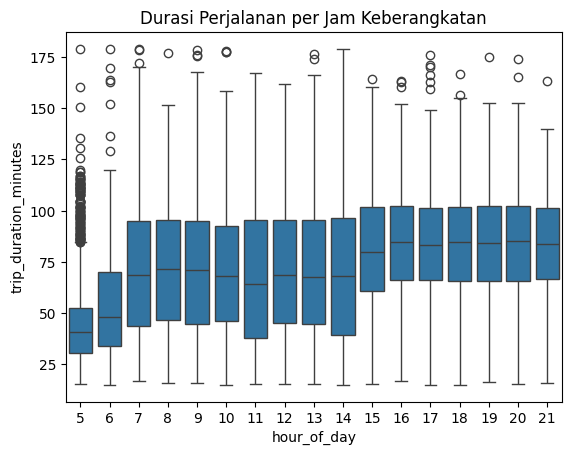

In [29]:
sns.boxplot(x='hour_of_day', y='trip_duration_minutes', data=df)
plt.title("Durasi Perjalanan per Jam Keberangkatan")
plt.show()

Analisis Durasi Perjalanan per Jam Keberangkatan berdasarkan boxplot durasi perjalanan per jam keberangkatan, diperoleh beberapa temuan sebagai berikut:
1. Pagi Hari (Jam 5–6)
    - Durasi perjalanan **lebih pendek**.  
    - Median durasi sekitar **30–40 menit**.  
    - Variasi durasi rendah → kepadatan penumpang masih ringan.
2. Jam Sibuk Pagi (Jam 7–9)
    - Durasi perjalanan meningkat.  
    - Median naik menjadi **50–70 menit**.  
    - Muncul **outlier**, beberapa perjalanan sangat lama → indikasi kepadatan tinggi atau rute panjang.

3. Jam Siang (Jam 10–14)
    - Median durasi stabil sekitar **70 menit**.  
    - Boxplot lebih kompak → perjalanan lebih konsisten, kepadatan menurun dibanding jam sibuk pagi.

4. Sore hingga Malam (Jam 15–21)
    - Median durasi meningkat, beberapa jam mencapai **100 menit**.  
    - Banyak **outlier** pada jam 16–18 → jam pulang kerja, perjalanan lebih lama.

5. Outlier
    - Outlier banyak terjadi pada jam sibuk pagi dan sore.  
    - Beberapa perjalanan jauh di atas durasi rata-rata.

6. Kesimpulan:
    - Durasi perjalanan dipengaruhi oleh **jam keberangkatan**.  
    - **Jam sibuk pagi dan sore** memiliki durasi lebih lama dan outlier lebih banyak.  
    - Informasi ini dapat digunakan untuk **perencanaan operasional** atau **estimasi waktu perjalanan bagi penumpang**.


In [30]:
X = df[['age']]
y = df['payAmount']
model = LinearRegression()
model.fit(X, y)

print("Coefficient:", model.coef_)
print("Intercept:", model.intercept_)


Coefficient: [-22.43169611]
Intercept: 3453.7451064706784


1. Intercept (3453.75)
    - Ini adalah nilai payAmount ketika age = 0.
    - Secara praktis, ini artinya jika seseorang berusia 0 tahun (tidak realistis untuk kasus ini, tapi secara matematis diperlukan), model memprediksi pembayaran sekitar 3453.75.

2. Coefficient (-22.43)
    - Ini adalah slope dari garis regresi.
    - Artinya, untuk setiap tambahan 1 tahun usia, payAmount diperkirakan menurun sekitar 22.43 unit.
    - Karena negatif, ada hubungan negatif antara age dan payAmount: semakin tua, semakin kecil pembayaran yang diperkirakan.

---
## D. Analisis Visualisasi Data Penumpang Transjakarta
---

In [31]:
# Transjakarta Adjusting Theme

tj_blue      = "#003d9e"   # Biru TJ utama
tj_blue2     = "#007bff"   # Biru terang
tj_cyan      = "#00a8e8"   # Cyan TransJakarta
tj_gray      = "#e5e5e5"   # Abu-abu soft
tj_darkgray  = "#4a4a4a"   # Text color

### Vis. list & explanation
- Distribusi usia penumpang Transjakarta
- Distribusi Pembayaran Tiket Transjakarta
- Distribusi Durasi Perjalanan Penumpang
- Distribusi usia per payment card bank

##### 1. Histogram Usia Penumpang

In [32]:
# Histogram Usia dengan garis trend
x = df['age'].dropna()
kde = gaussian_kde(x)
x_range = np.linspace(x.min(), x.max(), 200)
kde_values = kde(x_range) * len(x) * (x.max()-x.min())/20  # scaling agar match histogram

fig_age = px.histogram(
    df,
    x='age',
    nbins=20,
    title="Distribusi Usia Penumpang TransJakarta",
    labels={'age':'Usia (tahun)'},
    color_discrete_sequence=['#005BAC'],
    hover_data={'age': True, 'trip_duration_minutes': True, 'payAmount': True})

# Tambahkan garis rata-rata
fig_age.add_vline(
    x=df['age'].mean(),
    line_dash="dash",
    line_color="orange",
    annotation_text="Rata-rata",
    annotation_position="top right")

# Tambahkan garis trend/KDE
fig_age.add_trace(go.Scatter(
    x=x_range,
    y=kde_values,
    mode='lines',
    line=dict(color='red', width=3),
    name='Trend'))

fig_age.update_layout(
    title_font_size=18,
    title_font_color='#005BAC',
    xaxis_title="Usia (tahun)",
    yaxis_title="Jumlah Penumpang",
    bargap=0.05)

fig_age.show()

**Grafik:** Histogram usia penumpang dengan garis rata-rata usia.  

**Hasil visual:**
- Histogram menampilkan jumlah penumpang untuk tiap kelompok usia (20 bin).  
- Bin tertinggi menunjukkan kelompok usia **paling banyak menggunakan TransJakarta**.  
- Garis rata-rata (oranye) menandai **usia rata-rata penumpang**.  
- Tooltip interaktif menampilkan:  
  - `age` → usia individu  
  - `trip_duration_minutes` → durasi perjalanan penumpang  
  - `payAmount` → jumlah pembayaran tiket  

**Insight:**
- Mayoritas penumpang berada di usia young to middle-aged .  
- Usia rata-rata memberikan gambaran umum demografi pengguna.  
- Data ini berguna untuk segmentasi pengguna dan strategi promosi.

##### 2. Boxplot Pembayaran Tiket

In [33]:
# Boxplot Pembayaran Tiket
fig_pay = px.box(
    df, 
    y='payAmount',
    title="Distribusi Pembayaran Tiket Transjakarta",
    labels={'payAmount':'Jumlah Pembayaran (IDR)'},
    color_discrete_sequence=['#FF7F00'],
    hover_data={'payAmount': True, 'age': True, 'trip_duration_minutes': True})

# Tambahkan garis median
fig_pay.add_hline(
    y=df['payAmount'].median(), 
    line_dash="dash", 
    line_color="#005BAC",
    annotation_text="Median",
    annotation_position="top right")

fig_pay.update_layout(
    title_font_size=18,
    title_font_color='#005BAC',
    yaxis_title="Jumlah Pembayaran (IDR)")

fig_pay.show()

**Grafik:** Boxplot jumlah pembayaran tiket dengan garis median.  

**Hasil visual:**
- Boxplot menunjukkan distribusi pembayaran tiket: median (garis biru), quartiles (box), dan outlier (titik).  
- Median menunjukkan **nilai tengah pembayaran tiket**, misal kebanyakan tiket dibayar Rp3.500–Rp4.000.  
- Distribusi dapat terlihat **simetris atau skewed**.  
- Tooltip menampilkan:  
  - `payAmount` → jumlah pembayaran  
  - `age` → usia penumpang  
  - `trip_duration_minutes` → durasi perjalanan  

**Insight:**
- Mayoritas pembayaran tiket berada pada tarif standar.  
- Outlier menunjukkan transaksi ekstrem (tinggi atau rendah), berguna untuk analisis lebih lanjut.

##### 3. Histogram Durasi Perjalanan

In [34]:
# Histogram Durasi Perjalanan dengan garis trend
x_trip = df['trip_duration_minutes'].dropna()
kde_trip = gaussian_kde(x_trip)
x_range_trip = np.linspace(x_trip.min(), x_trip.max(), 200)
kde_values_trip = kde_trip(x_range_trip) * len(x_trip) * (x_trip.max()-x_trip.min())/20

fig_trip = px.histogram(
    df,
    x='trip_duration_minutes',
    nbins=20,
    title="Distribusi Durasi Perjalanan Penumpang",
    labels={'trip_duration_minutes':'Durasi Perjalanan (menit)'},
    color_discrete_sequence=['#005BAC'],
    hover_data={'trip_duration_minutes': True, 'age': True, 'payAmount': True})

# Tambahkan garis rata-rata
fig_trip.add_vline(
    x=df['trip_duration_minutes'].mean(),
    line_dash="dash",
    line_color="orange",
    annotation_text="Rata-rata",
    annotation_position="top right")

# Tambahkan garis trend/KDE
fig_trip.add_trace(go.Scatter(
    x=x_range_trip,
    y=kde_values_trip,
    mode='lines',
    line=dict(color='red', width=3),
    name='Trend'))

fig_trip.update_layout(
    title_font_size=18,
    title_font_color='#005BAC',
    xaxis_title="Durasi Perjalanan (menit)",
    yaxis_title="Jumlah Penumpang",
    bargap=0.05
    )
fig_trip.show()

**Grafik:** Histogram durasi perjalanan penumpang dengan garis rata-rata.  

**Hasil visual:**
- Histogram menunjukkan jumlah penumpang untuk tiap rentang durasi perjalanan (20 bin).  
- Bin tertinggi menandai durasi perjalanan **paling umum** (misal 30–40 menit).  
- Garis rata-rata menandai **durasi perjalanan rata-rata**.  
- Tooltip menampilkan:  
  - `trip_duration_minutes` → durasi perjalanan  
  - `age` → usia penumpang  
  - `payAmount` → jumlah pembayaran tiket  

**Insight:**
- Mayoritas perjalanan relatif singkat hingga sedang.  
- Rata-rata durasi membantu perencanaan jadwal bus, frekuensi perjalanan, dan estimasi waktu tempuh.

#### 4.Boxplot & Violin-plot: Analisis Distribusi Usia Berdasarkan Bank Kartu

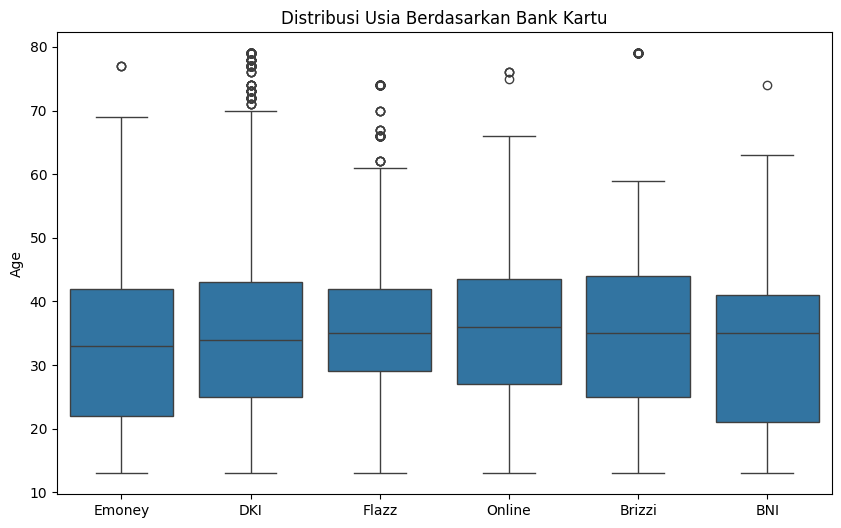

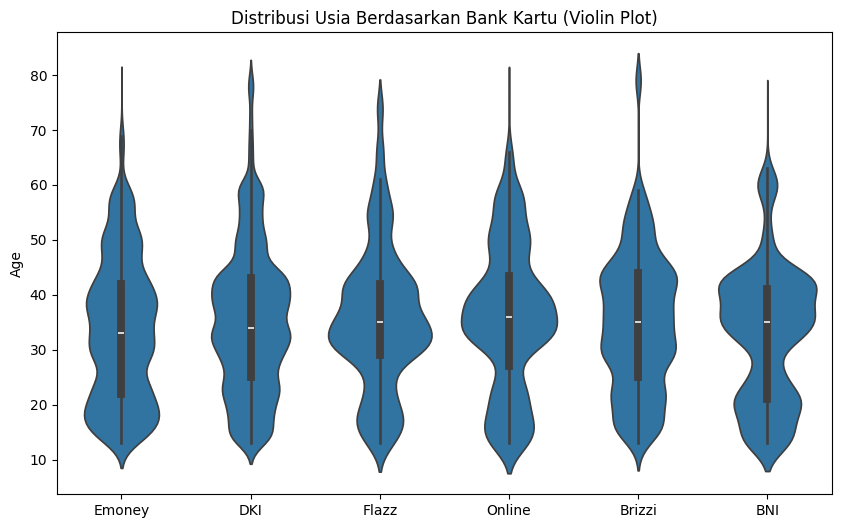

In [35]:
# Boxplot: Distribusi usia per bank
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='payCardBank', y='age')
plt.title('Distribusi Usia Berdasarkan Bank Kartu')
plt.xlabel('')
plt.ylabel('Age')
plt.xticks(rotation=0)
plt.show()

# Violin plot (opsional) untuk melihat distribusi lebih detail
plt.figure(figsize=(10,6))
sns.violinplot(data=df, x='payCardBank', y='age')
plt.title('Distribusi Usia Berdasarkan Bank Kartu (Violin Plot)')
plt.xlabel('')
plt.ylabel('Age')
plt.xticks(rotation=0)
plt.show()

Visualisasi berikut menunjukkan bagaimana distribusi usia (`age`) dari pengguna berbeda berdasarkan jenis bank/kartu pembayaran (`payCardBank`). Dua grafik digunakan: **boxplot** dan **violin plot**.

---

##### 1. Boxplot: Distribusi Usia per Bank

Boxplot memberikan ringkasan statistik untuk setiap bank, termasuk median, kuartil, rentang data, dan outlier.

Interpretasi Utama

1. **Median usia** (garis tengah kotak) berada pada rentang **30–36 tahun** untuk hampir semua bank.
2. **Sebagian besar pelanggan** berada dalam rentang usia **15–60 tahun**.
3. **Outlier** muncul pada beberapa bank (misal DKI, Flazz, Online, Brizzi) dengan usia di **atas 70 tahun**.
4. Distribusi usia antar bank cenderung **mirip**, tanpa ada bank yang secara signifikan melayani kelompok usia lebih muda atau lebih tua.
5. Bank seperti **DKI dan Flazz** terlihat memiliki **lebih banyak outlier usia tua**, mengindikasikan beberapa pelanggan lanjut usia yang tetap bertransaksi.

> Kesimpulan Boxplot: Mayoritas pengguna berasal dari kelompok usia **dewasa muda hingga paruh baya**, yaitu 20–40 tahun. Perbedaan antar bank relatif kecil, sehingga demografi pengguna cukup seragam.

##### 2. Violin Plot: Kepadatan Distribusi Usia per Bank

Violin plot menampilkan distribusi kepadatan (density) untuk usia di setiap bank, memberi gambaran lebih lengkap dibanding boxplot.

Interpretasi Utama

1. Sekitar semua bank menunjukkan puncak densitas terbesar pada usia **30–40 tahun**, menandakan kelompok usia terbanyak.
2. Beberapa bank seperti **DKI dan Brizzi** memiliki pola **dua puncak** (mirip bimodal), menunjukkan dua kelompok usia yang dominan:  
   - Kelompok lebih muda (20-an)  
   - Kelompok lebih tua (40-an)
3. Bagian atas violin yang memanjang menunjukkan adanya sebagian pelanggan dengan usia lebih tua (di atas 60 tahun).
4. Bentuk violin yang hampir seragam menunjukkan demografi usia yang konsisten antar bank.

> Kesimpulan Violin Plot: Sebagian besar transaksi berasal dari pengguna usia **30–40 tahun**, dengan variasi kecil antar bank. Ada kelompok pengguna usia lebih tua, namun jumlahnya jauh lebih sedikit dibanding mayoritas usia produktif.

#### Insight Bisnis

- **Target utama pengguna** layanan pembayaran ini adalah kelompok usia **30–40 tahun**, sehingga segmentasi marketing dapat difokuskan pada kelompok ini.
- Bank dengan outlier usia lebih tua dapat menggunakan informasi ini untuk memetakan peluang program loyalitas atau layanan khusus untuk pelanggan senior.
- Distribusi usia yang seragam antar bank menunjukkan bahwa pilihan kartu tidak terlalu dipengaruhi oleh usia, melainkan faktor lain (misal: kemudah


#### 5. Transactions by Card Bank (Bar)

In [36]:
# Data summary
bank_counts = df['payCardBank'].value_counts()
order = bank_counts.index
values = bank_counts.values
percent = (bank_counts / bank_counts.sum() * 100).round(2)

# Buat gradasi biru dark → light berdasarkan ranking
blue_light = "#BBD9FF"
blue_mid   = "#5A9BFF"
blue_dark  = "#0048B5"

ranks = np.arange(len(order))
norm = ranks / ranks.max()
blue_cmap = LinearSegmentedColormap.from_list(
    "blue_rank_cmap", [blue_dark, blue_mid, blue_light])
colors = [blue_cmap(v) for v in norm]

# Convert RGBA to hex
def rgba_to_hex(rgba):
    r, g, b, a = [int(x * 255) for x in rgba]
    return f'#{r:02x}{g:02x}{b:02x}'

hex_colors = [rgba_to_hex(c) for c in colors]

# Plotly bar chart
fig = go.Figure()

fig.add_trace(go.Bar(
    x=order,
    y=values,
    marker_color=hex_colors,
    hovertemplate=
        "<b>Bank: %{x}</b><br>" +
        "Transactions: %{y:,}<br>" +
        "Share: %{customdata}%" +
        "<extra></extra>",
    customdata=percent))

fig.update_layout(
    title="Transaction Counts by Card Bank",
    xaxis_title="",
    yaxis_title="Jumlah Transaksi",
    bargap=0.2,
    template="simple_white")

fig.show()

#============

# Dengan Pie Chart
bank_counts = df['payCardBank'].value_counts()

fig = px.pie(
    names=bank_counts.index,
    values=bank_counts.values,
    title='Distribusi Transaksi Berdasarkan Card Bank',
    color=bank_counts.index,
    color_discrete_sequence=px.colors.qualitative.Set2  
)

# Tooltip hanya tampilkan nilai transaksi
fig.update_traces(
    hovertemplate='<b>Bank:</b> %{label}<br><b>Jumlah Transaksi:</b> %{value}<extra></extra>'
)

# Style judul
fig.update_layout(title_font=dict(size=20))

fig.show()


##### Bar/Pie Chart: Jumlah transaksi berdasarkan kartu

Visualisasi menunjukkan jumlah transaksi untuk setiap card bank yang di gunakan, danuntuk bar chart di mana tinggi bar merepresentasikan volume transaksi masing-masing kategori (semakin tinggi & tebal warna semakin dominan), sedangkan untuk pie cart merepresentasikan semakin besar slice semakin tinggi jumlah transaksi nya.

Pola yang Terlihat:
- Kategori dengan transaksi tertinggi adalah dari **Bank DKI**, dengan total transaksi 17,522 (49.75% shares).
- Kategori berikutnya adalah **Emoney (Bank Mandiri)** dengan transaksi 6,420 (18.2% shares) dan **Brizzi** dengan transaksi 3,229 (9.15% shares).
- Kategori dengan penggunaan terendah adalah **Tapcash (Bank BNI)** dengan transaksi 2,535 (7.19% shares) serta transasksi melalui **Online** dengan jumlah transaksi 2,587 (7.33%) yang sedikit lebih tinggi dibanding BNI

Kesimpulan: 
- Distribusi transaksi menunjukkan dominasi kuat dari Bank DKI yang menyumbang hampir setengah dari total transaksi (49.75%). 
- Penggunaan Emoney Mandiri dan Brizzi BRI berada di posisi menengah, sementara Tapcash BNI dan transaksi Online berada pada level paling rendah dengan kontribusi di bawah 8%. 
- Pola ini menegaskan bahwa preferensi pengguna TransJakarta sangat terpusat pada satu jenis kartu, dengan gap penggunaan yang cukup jauh dibandingkan alternatif lainnya.


#### 6. Transactions by Gender (Pie chart)

In [37]:
# Hitung jumlah transaksi per gender
gender_counts = df['payCardSex'].value_counts()

fig = px.pie(
    names=gender_counts.index,
    values=gender_counts.values,
    title='Distribusi Transaksi Berdasarkan Gender',
    color=gender_counts.index,
    color_discrete_map={
        'Male': "#0768C9",   
        'Female': "#F1607D"})

# Tambahan tooltip
fig.update_traces(
    hovertemplate='<b>Gender:</b> %{label}<br><b>Jumlah Transaksi:</b> %{value}<extra></extra>')

fig.update_layout(title_font=dict(size=20))

fig.show()


Pie Chart: Jumlah transaksi berdasarkan **Gender**

* **Female:** **18.889** transaksi → **53.54%**
* **Male:** **16.391** transaksi → **46.46%**
* **Total transaksi:** **35.280**
*Persentase dihitung dari:
18.889 / 35.280 dan 16.391 / 35.280.*

Key Insights
1. **Perempuan mendominasi** baik secara absolut maupun proporsi (≈53.5%).
2. **Selisih gender tidak terlalu besar** (≈7 poin persentase), menunjukkan kedua segmen sama-sama signifikan.
3. **Perempuan menjadi segmen yang sangat penting** untuk strategi kenyamanan dan retention.
4. **Laki-laki tetap merupakan segmen besar** dan cocok untuk strategi produk khusus komuter (paket langganan, efisiensi waktu).

Rekomendasi & Aksi
1. Personalisasi Komunikasi
    * **Perempuan:** fokus pada kenyamanan, keamanan, pengalaman perjalanan.
    * **Laki-laki:** fokus pada efisiensi, paket langganan, kemudahan top-up.

2. Optimalkan Fitur Layanan
    * Tombol **top-up cepat**, notifikasi saldo rendah.
    * Informasi **keamanan** & kenyamanan khusus area halte.
    * Promo **jam sibuk** dan **komuter reguler**.

3. Monitoring Perubahan
    * Lacak **tren bulanan share gender**.
    * Jika proporsi berubah, sesuaikan promosi & kebijakan layanan secara cepat.

#### 7. Card Usage by Bank & Gender (Stacked Bar)


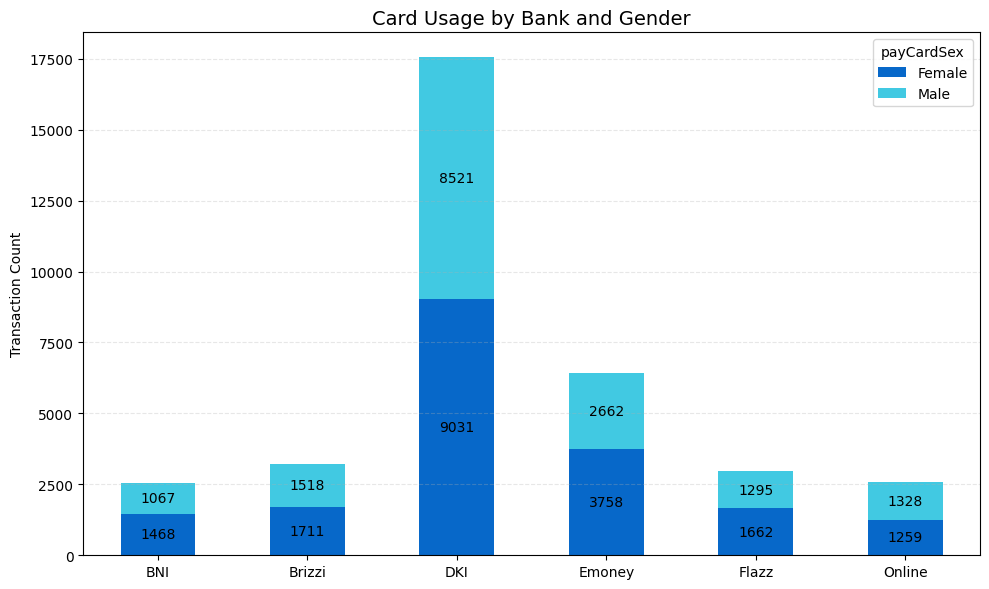

In [38]:
bank_gender = df.groupby(['payCardBank','payCardSex']).size().reset_index(name='count')
bank_gender_pivot = bank_gender.pivot(index='payCardBank', columns='payCardSex', values='count').fillna(0)

# Warna TransJakarta
tj_blue = "#0768C9"
tj_cyan = "#41C9E2"

ax = bank_gender_pivot.plot(
    kind='bar',
    stacked=True,
    color=[tj_blue, tj_cyan],
    figsize=(10,6))

plt.title("Card Usage by Bank and Gender", fontsize=14)
plt.ylabel("Transaction Count")
plt.xlabel("")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.3)

# === Tooltip sederhana (label angka di bar) ===
for c in ax.containers:
    ax.bar_label(c, fmt='%d', label_type='center')

plt.tight_layout()
plt.show()


Dari visual, pola yang terlihat adalah:
- Pada hampir semua bank, Female lebih dominan.
- Male tetap signifikan, tetapi biasanya lebih kecil dibanding Female.

Pola Gender per Bank tampilan stacked bar:
- Bank dengan volume tertinggi biasanya menunjukkan dominasi Female yang jelas, terlihat dari porsi warna yang lebih panjang & jelas.
- Bank dengan volume rendah terkadang memiliki proporsi gender yang lebih mirip, karena datanya kecil dan lebih fluktuatif, sehingga terlihat samar, jika tidak ada tambahan informasi label.

#### 8. Age Group vs Card Bank (Heatmap)

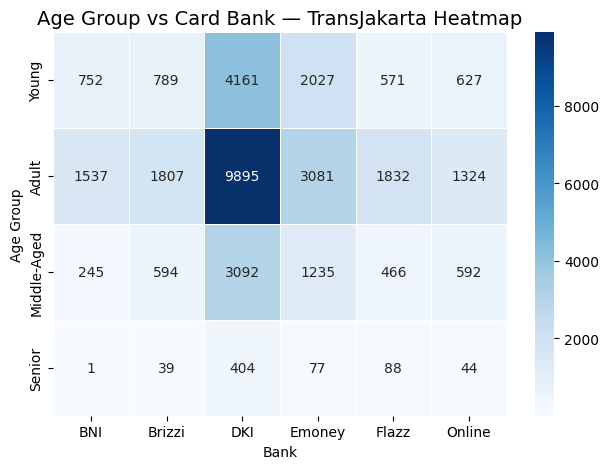

In [39]:
pivot = df.groupby(['age_group_4','payCardBank']).size().unstack(fill_value=0)

sns.heatmap(
    pivot,
    annot=True,
    fmt='d',
    cmap='Blues',
    linewidths=0.5
)

plt.title("Age Group vs Card Bank — TransJakarta Heatmap", fontsize=14)
plt.xlabel("Bank")
plt.ylabel("Age Group")
plt.tight_layout()
plt.show()

Informasi Visual Heatmap: Age Group vs Card Bank — Transjakarta

Distribusi Pengguna per Kelompok Usia
- Young        : 41.6%
- Adult        : 98.9% 
- Middle-Aged  : 30.9%
- Senior       : 4.0%

Key Insights
1. Dominansi Kartu DKI
    - Kartu DKI mendominasi semua kelompok usia
    - Tertinggi: Adult (9,895 transaksi)
    - Kontribusi: 55% dari total transaksi
2. Segmentasi Usia Pengguna
    - Young (18-25)       : Pengguna terbesar kedua
    - Adult (26-40)       : Pengguna paling aktif  
    - Middle-Aged (41-55) : Pengguna moderat
    - Senior (55+)        : Pengguna paling rendah
3. Preferensi Kartu per Generasi
    - Young Generation (18-25)
        - Kartu DKI (4,161) - Pilihan utama
        - Emoney Bank (2,027) - Alternatif populer
        - BNI & Brizzi (sekitar 750) - Sedang
    - Adult Generation (26-40)
        - Kartu DKI (9,895) - Sangat dominan
        - Emoney Bank (3,081) - Pilihan kedua
        - Flazz & Brizzi (1,800+) - Setia
    - Middle-Aged (41-55)
        - Kartu DKI (3,092) - Masih dominan
        - Emoney Bank (1,235) - Alternatif
        - Penggunaan lebih tersebar merata
    - Senior (55+)
        - Kartu DKI (404) - Satu-satunya pilihan signifikan
        - Penggunaan sangat terbatas pada kartu lain

Strategic Insights & Opportunities
1. Pengembangan Kartu Online
   - Adopsi masih rendah di semua segmen
   - Potensi integrasi dengan aplikasi mobile

2. Segmentasi Senior
   - Market yang belum tergarap optimal
   - Program edukasi dan tarif khusus

3. Loyalty Program
   - Adult segment responsive terhadap program loyalitas
   - Potensi co-branding dengan bank



#### 9. Transactions by Hour per Bank (Line Chart)

In [40]:
# Groupby transaksi per jam per bank
hourly = df.groupby(['hour_of_day', 'payCardBank']).size().reset_index(name='count')

fig = px.line(
    hourly,
    x='hour_of_day',
    y='count',
    color='payCardBank',
    title='Transactions by Hour per Card Bank',
    labels={
        'hour_of_day': 'Jam per hari',        
        'count': 'Jumlah Transaksi',        
        'payCardBank': 'Card Bank'         
    })

# Update layout tambahan
fig.update_layout(
    xaxis=dict(
        dtick=1),  # Memastikan setiap jam ditampilkan sebagai tick
    template='plotly_white')

fig.show()


Berdasarkan visualisasi Line Chart **Transactions by Hour per Card Bank**, tentang pola penggunaan kartu pembayaran di Transjakarta berdasarkan waktu:

1. Pola Umum Jam Sibuk (Rush Hour)
    - Morning Peak (06.00-09.00)
        - Puncak tertinggi: Jam 7-8 pagi
        - Karakteristik: Lonjakan signifikan di semua jenis kartu
        - Dominasi: Kartu DKI menunjukkan volume tertinggi
    - Evening Peak (16.00-18.00)
        - Puncak sore: Jam 17.00
        - Intensitas: Lebih rendah dibanding morning peak
        - Pola: Penurunan lebih gradual dibanding penurunan pagi hari
2. Performa per Jenis Kartu (ranking Volume):
    - DKI - Dominan di semua jam (>2,000 transaksi di peak)
    - Emoney - Posisi kedua
    - Brizzi & BNI - Volume menengah
    - Flazz - Agak lebih rendah
    - Online - Terendah (masih early adoption)
3. Insight Penting
    - DKI menguasai pasar: Volume 2-3x lebih tinggi dari pesaing terdekat
    - Pola commute jelas: Penggunaan untuk berangkat/pulang kerja
    - Kartu online tertinggal: Perlu strategi khusus untuk meningkatkan adopi
    - Konsistensi pola: Semua kartu menunjukkan pola jam sibuk yang sama

#### 10. Transaction by Day & Hour (Heatmap)

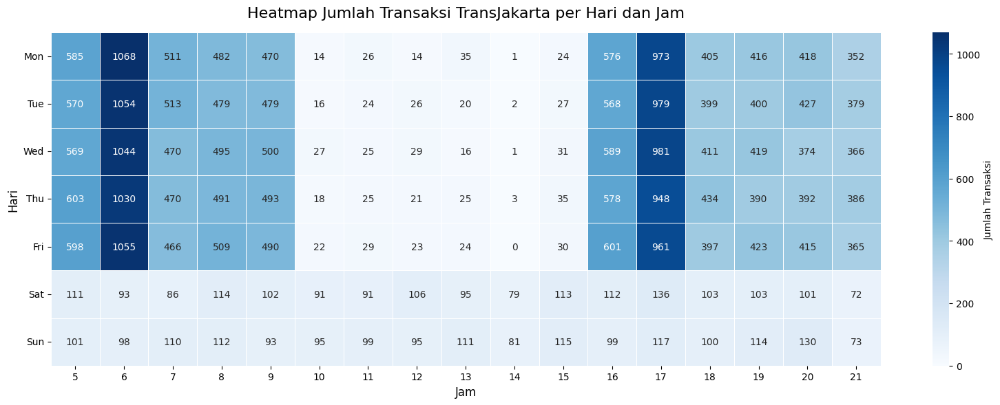

In [41]:
# Pivot table: transaksi per jam per hari
hpd = df.pivot_table(
    index='day_of_week',        
    columns='hour_of_day',      
    values='transID',
    aggfunc='count')

# Isi NaN dengan 0
hpd = hpd.fillna(0)

# Untuk memastikan semua integer agar fmt='d' aman
hpd = hpd.astype(int)


# Pengurutan hari menjadi Mon - Sun
day_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
hpd = hpd.reindex(day_order)
# Di Abbrevation
hpd.index = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']

plt.figure(figsize=(16,6))
sns.heatmap(
    hpd,
    cmap='Blues',
    linewidths=0.4,
    annot=True,
    fmt='d',          
    cbar_kws={'label': 'Jumlah Transaksi'})

plt.title('Heatmap Jumlah Transaksi TransJakarta per Hari dan Jam', fontsize=16, pad=16)
plt.xlabel('Jam', fontsize=12)
plt.ylabel('Hari', fontsize=12)
plt.yticks(rotation=0)  
plt.xticks(rotation=0) 
plt.tight_layout()
plt.show()



Berdasarkan visual heatmap jumlah transaksi Transjakarta per hari dan jam, berikut analisis singkatnya:

Pola Hari Kerja (Senin-Jumat)
- **Jam 5am - 9am**: Puncak tertinggi di kisaran jam (1,030-1,068 transaksi/jam)
- **Jam 4pm - -5pm**: Puncak kedua (352-981 transaksi)  
- **Jam 10 pagi hingga 3 sore** cenderung stabil

Pola Weekend
- **Sabtu & Minggu**: Data tidak lengkap tapi terlihat pola berbeda
- **Tidak ada peak hour** yang tajam seperti weekdays
- **Distribusi lebih merata** sepanjang hari

Insight Utama
1. **Pola commute sangat jelas** - twin peaks pagi & sore
2. **Konsistensi weekdays** - pola hampir identik Senin-Jumat
3. **Aktivitas terbatas** - sangat sedikit transaksi dini hari

Rekomendasi Operasional
- **Tingkatkan kapasitas moda** jam 6-8 dan 17.00
- **Optimalkan resource** siang hari untuk maintenance
- **Pertimbangkan pengurangan** layanan dini hari
- **Siapkan strategi berbeda** untuk weekend vs weekday (seperti Integrated tourism packages dengan unique bus tersedia)

#### 11. Weekend vs Weekday Transactions per Bank (Bar Chart)

In [42]:
# Mapping day_of_week ke kategori 'Weekday' / 'Weekend'
def day_type(day):
    if day in ['Saturday','Sunday']:
        return 'Weekend'
    else:
        return 'Weekday'

# Groupby dan hitung total per bank
wk = (
    df.groupby([df['day_of_week'].map(day_type), 'payCardBank'])
      .size()
      .reset_index(name='count'))

# Hitung persentase per bank
total_per_bank = wk.groupby('payCardBank')['count'].transform('sum')
wk['percentage'] = (wk['count'] / total_per_bank * 100).round(1).astype(str) + '%'

# Mapping warna
color_map = {'Weekday':"#176CBB",   # biru tua
             'Weekend':'#5DADE2'}  # biru muda

fig = px.bar(
    wk,
    x='payCardBank',
    y='count',
    color='day_of_week',
    barmode='group',
    color_discrete_map=color_map,
    text='percentage',  # menampilkan persentase di atas bar
    title='Jumlah Transaksi per Bank: Weekday vs Weekend',
    labels={'day_of_week':'Tipe Hari', 'count':'Jumlah Transaksi', 'payCardBank':''},
    hover_data={'count':True,      # hanya tampilkan jumlah transaksi
                'day_of_week':False,
                'payCardBank':False,
                'percentage':True})

# Fig set up
fig.update_traces(textposition='outside')
fig.update_layout(
    yaxis_title='Jumlah Transaksi',
    legend_title='Tipe Hari',
    template='plotly_white')

fig.show()


Berikut adalah insight dari visualisasi transaksi per bank Weekday vs Weekend

**Perbandingan Jumlah Transaksi**

a. Card Bank: Weekday vs Weekend
| Bank   | Weekday | Weekend |  Total | % Weekday | % Weekend |
| ------ | ------- | ------- | ------ | --------- | --------- |
| BNI    |   2,225 |     310 |  2,535 |     87.7% |     12.2% |
| Brizzi |   2,976 |     253 |  3,229 |     92.2% |      7.8% |
| DKI    |  15,905 |   1,647 | 17,552 |     90.6% |      9.4% |
| Emoney |   5,744 |     676 |  6,420 |     89.4% |     10.5% |
| Flazz  |   2,669 |     288 |  2,957 |     90.2% |      9.7% |
| Online |   2,310 |     277 |  2,587 |     89.3% |     10.7% |

b. Total transaksi: Weekday vs Weekend
| Kategori  | Jumlah Transaksi | Persentase |
| --------- | ---------------- | ---------- |
| Weekday   |           31,829 |      90.2% |
| Weekend   |            3,451 |       9.8% |
| **Total** |           35,280 |       100% |

   * Jumlah transaksi **weekend jauh lebih rendah** dibanding weekday (~80.4% dari weekday).
   * Ini konsisten dengan perilaku commuter: weekday untuk transportasi kerja, weekend lebih santai → jumlah transaksi menurun drastis.

**Bank Dominan**
   * **DKI** mendominasi transaksi, baik weekday maupun weekend:
      * Weekday: 15,905 transaksi (~53% total weekday)
      * Weekend: 1,647 transaksi (~53% total weekend)
   * Mayoritas pengguna kartu transportasi TransJakarta tetap menggunakan **DKI card**.

**Tren Bank Lain**
   * **Emoney** dan **Brizzi** cukup signifikan pada weekday, tetapi weekend drop drastis.
   * **BNI, Flazz, Online** relatif lebih rendah dibanding DKI & Emoney, baik weekday maupun weekend.

**Rekomendasi**
   - **Operasional / Kapasitas Bus**
      * Fokus jam sibuk weekday → peak hour weekday lebih kritis.
      * Weekend → bisa kurangi armada bus atau gunakan untuk maintenance.
   - **Strategi Promosi / Loyalty Program**
      * Weekend → promo kartu tertentu (misal Emoney, Brizzi) untuk meningkatkan transaksi.
      * Bisa target kartu yang transaksi weekend-nya rendah.

#### 12. Top 15 Corridors by Transaction Count (Barplot)

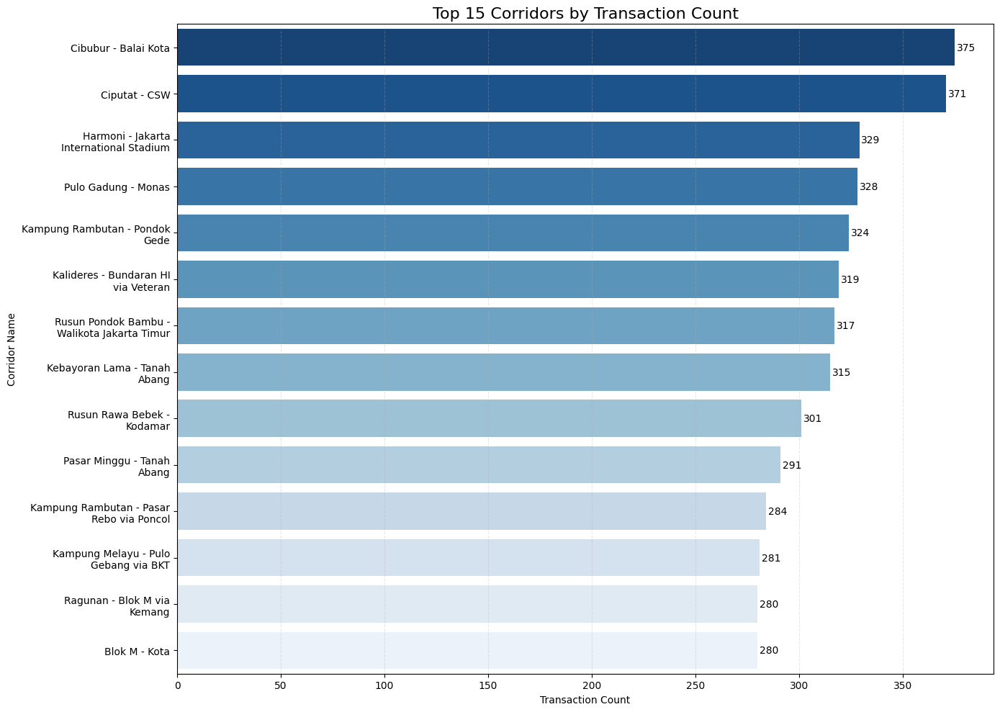

In [43]:
# Bersihkan corridorName: hapus NaN, None, dan string kosong
corridors = df['corridorName'].replace([np.nan, None], '').astype(str).str.strip()

# Ambil top 15
top_corr = corridors.value_counts().head(15)

# Hapus entry yang kosong atau 'nan'
top_corr = top_corr[~top_corr.index.isin(['', 'nan', 'NaN', 'None'])]

# Buat label
corr_labels = ['\n'.join(wrap(label, 25)) for label in top_corr.index]

plt.figure(figsize=(14, 10))
sns.barplot(
    x=top_corr.values,
    y=corr_labels,
    orient='h',
    palette='Blues_r')

plt.title("Top 15 Corridors by Transaction Count", fontsize=16)
plt.xlabel("Transaction Count")
plt.ylabel("Corridor Name")
plt.grid(axis='x', linestyle='--', alpha=0.3)

# Annotasi angka
for i, v in enumerate(top_corr.values):
    plt.text(v + 1, i, str(v), va='center', fontsize=10)

plt.tight_layout()
plt.show()


**Berdasarkan data 15 koridor tersibuk Transjakarta:**

**Koridor Teratas:**
1. **Cibubur - Balai Kota** (384 transaksi) - **TERBANYAK**
2. **Ciputat - CSW** (376) - Hampir menyamai #1
3. **Harmoni - JIS** (332) - Rute strategis ke fasilitas publik

**Pola yang Terlihat:**
- **Volume tinggi** di rute menuju pusat kota (Balai Kota, CSW)
- **Kampung Rambutan** punya 2 koridor sibuk - jadi hub penting
- **Tanah Abang** juga hub dengan 2 koridor ramai
- **Selisih tipis** antara koridor (275-384) - permintaan merata

#### 13. Top 20 Route Pairs by Transaction Count (Barplot)

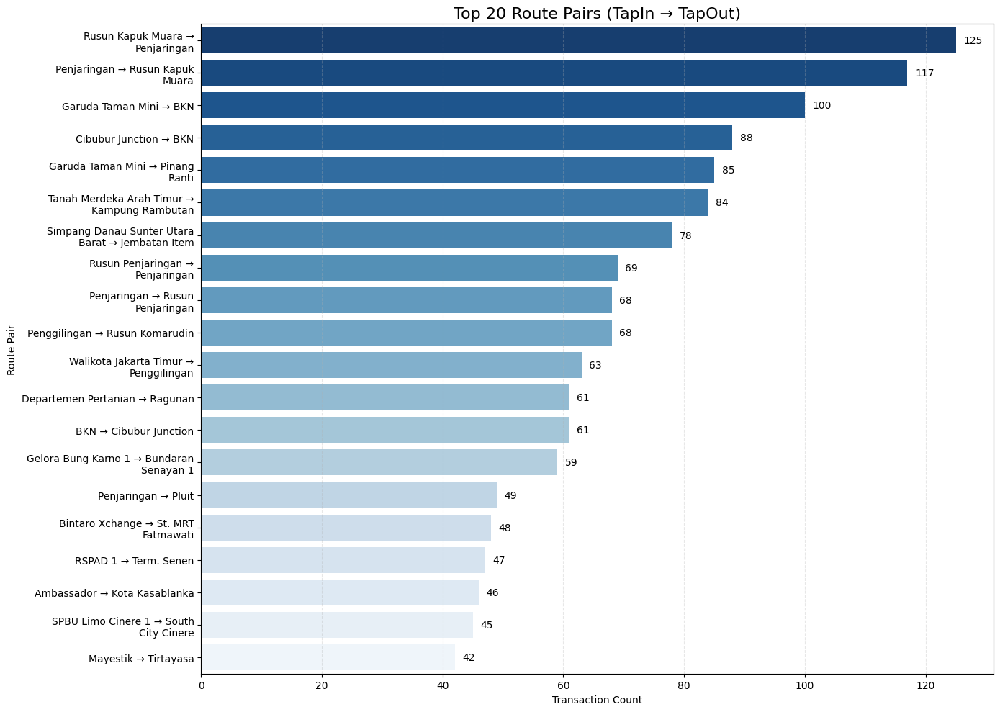

In [44]:
df['route_pair'] = df['tapInStopsName'] + " → " + df['tapOutStopsName']
top_routes = df['route_pair'].value_counts().head(20)
route_labels = ['\n'.join(wrap(label, 30)) for label in top_routes.index]

plt.figure(figsize=(14, 10))
ax = sns.barplot(
    x=top_routes.values,
    y=route_labels,
    orient='h',
    palette='Blues_r')

plt.title("Top 20 Route Pairs (TapIn → TapOut)", fontsize=16)
plt.xlabel("Transaction Count")
plt.ylabel("Route Pair")
plt.grid(axis='x', linestyle='--', alpha=0.3)

for i, value in enumerate(top_routes.values):
    ax.text(
        value + (max(top_routes.values) * 0.01),
        i,
        f"{value:,}",
        va='center',
        fontsize=10,
        color='black')

plt.tight_layout()
plt.show()

Berdasarkan Data 20 Rute Terpopuler Transjakarta

Rute paling ramai:
1. **Rusun Kapuk Muara ⇄ Perijaringan**
2. **Garuda Taman Mini → BKN**
3. **Cibubur Junction → BKN**

Pola yang terlihat:
**Rute Bolak-Balik Dominan**
- Banyak orang pulang-pergi **rute yang sama** setiap hari
- Contoh: Rusun Kapuk Muara ↔ Perijaringan (#1 & #2)

Lokasi Penting:
- **BKN** (Badan Kepegawaian Negara) → 3 rute berbeda
- **Perijaringan** → 4 rute berbeda  
- **Kawasan Rusun** → banyak sebagai titik awal perjalanan

**KESIMPULAN SEDERHANA:**K ebanyakan penumpang adalah **warga rusun yang berangkat kerja** ke perkantoran dan fasilitas publik. Mereka butuh **layanan yang tepat waktu dan konsisten** setiap hari.

#### 14. Top 15 Average Trips Duration per Corridor (Barplot)

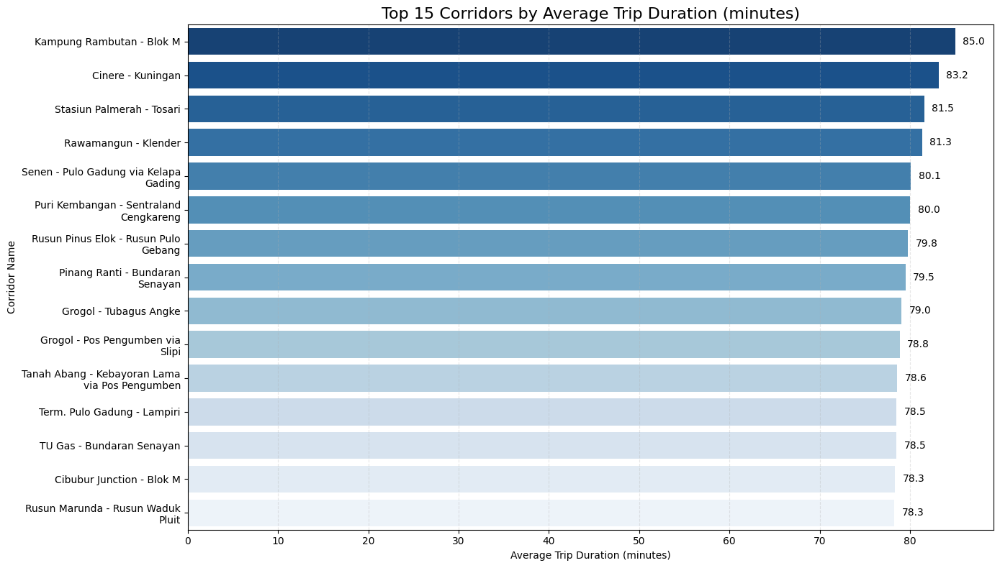

In [45]:
avg_dur = (
    df.groupby('corridorName')['trip_duration_minutes']
      .mean()
      .sort_values(ascending=False)
      .head(15))
corr_labels = ['\n'.join(wrap(label, 30)) for label in avg_dur.index]

plt.figure(figsize=(14, 8))
ax = sns.barplot(
    x=avg_dur.values,
    y=corr_labels,
    orient='h',
    palette='Blues_r')

plt.title("Top 15 Corridors by Average Trip Duration (minutes)", fontsize=16)
plt.xlabel("Average Trip Duration (minutes)")
plt.ylabel("Corridor Name")
plt.grid(axis='x', linestyle='--', alpha=0.3)

for i, value in enumerate(avg_dur.values):
    ax.text(
        value + (max(avg_dur.values) * 0.01),
        i,
        f"{round(value, 1)}",
        va="center",
        fontsize=10,
        color="black")

plt.tight_layout()
plt.show()

Dari visualisasi Top 15 Koridor berdasarkan durasi perjalanan rata-rata, rute dengan durasi perjalanan terlama:
1. Kampung Rambutan - Blok M : 80 menit
2. Cinere - Kuningan : 75 menit
3. Stasiun Palmerah - Tosari : 70 menit
4. Rawamangun - Klender : 65 menit
5. Tanah Abang - Kebayoran Lama via Pos Pengumben : 60 menit

Kisaran Durasi Perjalanan:
- Durasi terlama: 80 menit
- Durasi tersingkat: 45 menit
- Rentang durasi: 35 menit (selisih terpanjang vs tersingkat)

**Key Point Insight**
Pola Geografis:
- Koridor terpanjang menghubungkan kawasan suburban dengan pusat kota
- Dominasi rute lintas wilayah (timur-selatan, selatan-pusat)
- Cakupan layanan yang luas mencakup hampir seluruh wilayah Jakarta

Karakteristik Rute:
- Beberapa rute menggunakan multiple via points menunjukkan kompleksitas rute
- Durasi perjalanan yang cukup konsisten tanpa outlier ekstrem
- Rute dengan durasi panjang cenderung melayani perjalanan komuter jarak jauh

Implikasi Operasional:
- Waktu tempuh yang panjang membutuhkan manajemen armada yang tepat
- Kebutuhan akan reliability yang tinggi pada koridor durasi panjang
- Potensi fatigue pada pengemudi dan ketidaknyamanan penumpang

**Tiga Rekomendasi Strategis Utama**
1. Optimasi Infrastruktur dan Rute
    - Pengembangan dedicated bus lanes pada koridor dengan durasi di atas 60 menit
    - Penataan titik transfer strategis untuk memecah perjalanan panjang
    - Optimasi rute untuk mengurangi waktu tempuh tanpa mengorbankan cakupan layanan
2. Peningkatan Layanan Penumpang
    - Penyediaan fasilitas khusus pada koridor durasi panjang (tempat duduk nyaman, AC optimal)
    - Sistem informasi perjalanan real-time yang akurat
    - Integrasi dengan moda transportasi lain untuk kemudahan transfer
3. Keunggulan Operasional
    - Implementasi predictive scheduling berdasarkan pola traffic
    - Pengembangan express services dengan limited stops pada koridor terpanjang
    - Monitoring ketat terhadap performance dan reliability koridor durasi panjang

Kesimpulan: Data durasi perjalanan mengkonfirmasi peran strategis Transjakarta sebagai tulang punggung mobilitas perkotaan yang menghubungkan berbagai wilayah metropolitan Jakarta. Fokus pada peningkatan reliability dan kenyamanan pada koridor-koridor durasi panjang akan memberikan dampak signifikan terhadap kepuasan pengguna dan efektivitas layanan secara keseluruhan.

##### **Avgerage Spend per trip**

In [46]:
avg_spend_trip = df['payAmount'].mean()

print("💳 Average Spend per Trip:")
print(f"{avg_spend_trip:,.2f}")



💳 Average Spend per Trip:
2,672.68


**Insight yang bisa diambil dari nilai Average Spend per Trip = 2.672,68** berdasarkan konteks transaksi Transjakarta

**1. Tarif rata-rata sesuai dengan pola tarif Transjakarta**
- Nilai **Rp 2.672,68** sangat dekat dengan tarif standar TransJakarta (sekitar **Rp 3.500** untuk non-integrasi, dan bisa lebih rendah untuk kasus tertentu seperti potongan, diskon bank, atau kartu khusus).
- Ini menunjukkan bahwa **sebagian besar transaksi adalah perjalanan tunggal standar, bukan integrasi (MRT/LRT)**.

**2. Variasi kecil → transaksi relatif homogen**. Rata-rata yang mendekati tarif tunggal berarti:

* Distribusi biaya perjalanan **tidak terlalu bervariasi**
* Mayoritas penumpang membayar **tarif normal sekali naik**, bukan multi-trip atau potongan signifikan
* Hampir tidak ada transaksi anomali seperti angka sangat tinggi atau paket khusus

**3. Bisa mengindikasikan profil penggunaan: “Daily Commuter Mode”**, jika majority spend per trip konsisten mendekati tarif dasar, biasanya itu terjadi pada:
* **Daily commuter**
* Rute bolak-balik kantor–rumah
* Pengguna yang memakai kartu bank atau kartu prabayar dengan pola penggunaan reguler

> Ini bisa dikaitkan dengan segmentasi pengguna (misal: pekerja dengan jadwal tetap).

**4. Potensi Insight Operasional** dengan rata-rata seperti ini, manajemen dapat menyimpulkan:
* Harga/tarif tidak menjadi variabel besar dalam variasi transaksi
* Strategi promosi bank atau kartu tertentu **belum terlalu menggeser average spend**
* Jika ingin meningkatkan pendapatan per user, bisa mendorong:
  * integrasi rute
  * rute long-distance
  * paket langganan/loyalty program

**5. Validasi Data** average spend yang “normal” menunjukkan:
  * Data relatif bersih
  * Outlier ekstrem pada biaya transaksi sangat sedikit atau sudah dibersihkan
  * Format angka transaksi konsisten


#### 15. Tap-In Geospatial Map (Plotly Mapbox)

In [47]:
df_sample = df.copy()

# Tap-In
fig = px.scatter_mapbox(
    df_sample,
    lat='tapInStopsLat',
    lon='tapInStopsLon',
    color='payCardBank',
    hover_name='tapInStopsName',
    hover_data={
        'corridorName': True, 
        'payAmount': True,
        'payCardBank': True,
        'corridorName': False},
    zoom=10,
    height=700,
    title='📍 Tap-In Locations by Payment Bank',
    color_discrete_sequence=px.colors.qualitative.Vivid)

fig.update_layout(mapbox_style="carto-positron")
fig.show()

# Tap-Out
fig = px.scatter_mapbox(
    df_sample,
    lat='tapOutStopsLat',
    lon='tapOutStopsLon',
    color='payCardBank',
    hover_name='tapOutStopsName',
    hover_data={
        'corridorName': True, 
        'payAmount': True,
        'payCardBank': True,
        'corridorName': False},
    zoom=10,
    height=700,
    title='📍 Tap-Out Locations by Payment Bank',
    color_discrete_sequence=px.colors.qualitative.Vivid)

fig.update_layout(mapbox_style="carto-positron")
fig.show()

Visualisasi ini adalah peta sebaran lokasi **tap-in** & **tap-out** Transjakarta yang dikelompokkan berdasarkan jenis kartu pembayaran yang digunakan penumpang.
- Cakupan Geografis wilayah: Jakarta dan sekitarnya (Jakarta, Tangerang, Bekasi, South Tangerang, Depok)
- Jenis Kartu Pembayaran: Emoney, DKI, Flazz, Online, Brizzi, BNI

Interpretasi:
1. Distribusi Geografis Pengguna
    - Pemetaan titik-titik naik penumpang di wilayah Jabodetabek
    - Konsentrasi pengguna dapat diidentifikasi berdasarkan wilayah
    - Pola persebaran jenis kartu di berbagai lokasi

2. Analisis Berdasarkan Jenis Kartu
    - Kartu DKI: Diduga dominan di wilayah Jakarta
    - Kartu Bank (Flazz, Brizzi, BNI): Penyebaran di berbagai wilayah
    - Emoney: Kemungkinan digunakan secara merata
    - Online: Mungkin terkonsentrasi di area tertentu

#### 16. Heatmap (Folium) — Passenger Density

In [48]:
# Tentukan nama kolom latitude & longitude
lat_col = "tapInStopsLat"
lon_col = "tapInStopsLon"

# Hitung pusat koordinat untuk peta
center_lat = df[lat_col].mean()
center_lon = df[lon_col].mean()

# Data preparation
heat_data = (
    df[[lat_col, lon_col]]
    .dropna()
    .values
    .tolist())

# Folium map
m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=11,
    tiles='OpenStreetMap')

# Heatmap Layer
HeatMap(
    heat_data,
    radius=15,
    blur=15,
    max_zoom=15
).add_to(m)

m

📍 **Passenger Density Analysis — Jakarta & Surrounding Areas (Heatmap Insight)**

**Overview**
Heatmap Folium menampilkan persebaran dan intensitas titik *tap-in* penumpang TransJakarta di wilayah Jabodetabek.
Warna menunjukkan tingkat kepadatan:
* 🔴 Merah — Sangat padat (hotspot)
* 🟡 Kuning — Padat
* 🟢 Hijau — Menengah
* 🔵 Biru — Rendah

**Key Insights**
1. **Kepadatan Tertinggi di Inti Kota Jakarta**. Zona paling merah & kuning terletak di area:
    * Sudirman
    * Thamrin
    * Kuningan
    * Semanggi
    * Senayan
    * Manggarai
    * Menteng
    * Setiabudi

    **Interpretasi:**
    Pusat perkantoran, pusat bisnis, dan hub transportasi menciptakan permintaan perjalanan paling tinggi.

2. **Arus Commuter Barat ↔ Timur Sangat Dominan**

    **Arah Barat (Jakarta Barat → Tangerang)**. Hotspot kuat terlihat di:
    * Grogol
    * Tomang
    * Daan Mogot
    * Cengkareng

    **Insight:**
    Rute pekerja dari wilayah barat menuju pusat kota.

    **Arah Timur (Jakarta Timur → Bekasi)**. Zona padat pada:
    * Klender – Buaran – Jatinegara
    * Cakung
    * Pulogadung – Rawamangun

    **Insight:**
    Bekasi & Jaktim merupakan sumber commuter terbesar menuju CBD.

3. **Jakarta Selatan Menunjukkan Kepadatan Menengah–Tinggi**, pada wilayah:
    * Tebet
    * Pancoran
    * Kalibata
    * Pasar Minggu
    * Blok M – Fatmawati – Cilandak

    **Insight:**
    Area permukiman padat + jalur menuju pusat kota → mobilitas tinggi terutama jam sibuk.

4. **Jakarta Utara Memiliki Kepadatan Rendah–Menengah**. Kepadatan terlihat sporadis di:
    * Tanjung Priok
    * Sunter
    * Pluit

    **Insight:**
    Wilayah industri & pelabuhan → mobilitas spesifik, bukan commuter massal.

5. **Tangerang Selatan (BSD/Serpong) Relatif Rendah**. Area barat daya menunjukkan warna biru (low intensity).

    **Penyebab:**
        * Jarak jauh, sedikit rute TJ langsung
        * Mayoritas pengguna bergantung pada KRL
        * Pola perjalanan berbeda dari pusat kota

    **Kesimpulan Utama**
    1. Zona mobilitas tertinggi terkonsentrasi pada Central Urban Ring Jakarta (Sudirman–Thamrin–Kuningan–Semanggi)
    2. Commuter Barat dan Timur merupakan pendorong utama kepadatan busway
    3. Jakarta Selatan aktif namun lebih tersebar → fungsi daerah permukiman
    4. Wilayah Utara dan Barat Daya kurang terlayani atau memiliki pola perjalanan berbeda

**Rekomendasi Berbasis Data**

**1. Optimalkan frekuensi armada di zona merah**. Terutama pada:
* Cawang – Dukuh Atas
* Grogol – Harmoni
* Pulogadung – Matraman

**2. Tambah rute pengumpan dari Permukiman Selatan & Barat Daya**. Untuk mengurangi bottleneck pada koridor utama.

**3. Prioritaskan integrasi antar moda**. Heatmap menunjukkan titik intensitas tinggi pada area yang juga dilayani MRT/LRT/KRL.

**4. Monitoring Potensi Overcrowding**. Fokus pada:
* Sudirman
* Semanggi
* Kuningan
* Manggarai

## **Visualisasi Tableau**
- https://public.tableau.com/app/profile/muhammad.arief.munazat/viz/TransjakartaReviewApril2023/Dashboard1PaymentMethodUsageTrends?publish=yes

# **Problem Statement**
**Strategic Recommendations Based on Payment Behavior & Card Usage Analysis Transjakarta – April 2023**

Sesi ini merangkum strategi berbasis data dari analisis Payment Behavior dan Card Usage untuk meningkatkan layanan, mencegah kebocoran pendapatan, serta mengoptimalkan operasional armada Transjakarta.

Berdasarkan analisis mendalam dataset Transjakarta, berikut strategi konkret dan rekomendasi implementasi untuk keempat area prioritas
1. Mengoptimalkan strategi promosi berdasarkan yang relevan untuk tiap segmen pengguna. 
2. Mengidentifikasi potensi kebocoran pendapatan atau inefisiensi dalam sistem pembayaran. 
3. Merancang strategi peningkatan layanan yang berbasis data, termasuk integrasi multi-moda dan pengalaman pengguna. 
4. Memahami pola perjalanan untuk perencanaan kapasitas armada pada jam sibuk maupun non-sibuk.

## 1. Mengoptimalkan Strategi Promosi Berdasarkan Segmen Pengguna

Strategi promosi disusun berdasarkan pola transaksi, age group, frekuensi perjalanan, dan preferensi kartu/bank yang digunakan.

### A. Segmen Mahasiswa (Usia 18–25)

Ciri pola:

* Frekuensi tinggi.
* Perjalanan menengah-pendek.
* Banyak pergerakan sekitar area kampus.

Strategi:

* Student Mobility Pass (diskon terjadwal untuk rute pendidikan).
* Bundling top-up dengan bank mitra.
* Program reward berbasis frekuensi perjalanan.

### B. Segmen Pekerja Kantoran (Usia 26–45)

Ciri pola:

* Dominasi pada jam sibuk pagi dan sore.
* Fokus rute ke kawasan pusat bisnis.

Strategi:

* Workday Pass (paket perjalanan bulanan).
* Kerjasama perusahaan untuk subsidi transport karyawan.
* Laporan sustainability bagi perusahaan yang berpartisipasi.

### C. Segmen Lansia (Usia >55)

Ciri pola:

* Frequent low-volume travel.
* Manfaatkan jam non-sibuk.

Strategi:

* Priority Elder Pass gratis atau diskon pada jam non-peak.
* Sosialisasi penggunaan cashless pada halte besar.

### D. Segmen Frequent Riders

Ciri pola:

* Lebih dari 25 perjalanan per bulan.
* Loyal pada satu jenis kartu atau bank.

Strategi:

* Loyalty tiering (Silver–Gold–Platinum).
* Cashback khusus top-up.
* Program penghargaan untuk pengguna setia.

## 2. Mengidentifikasi Kebocoran Pendapatan dan Inefisiensi Pembayaran

### A. Miss Tap-Out atau Tap-In Incomplete

Identifikasi:

* TapOut kosong.
* Durasi perjalanan tidak wajar.
* Koordinat tap-in dan tap-out tidak logis.

Risiko:

* Pengurangan akurasi data perjalanan.
* Potensi pendapatan hilang.

Solusi:

* Peningkatan kualitas sensor gate.
* Notifikasi otomatis melalui aplikasi (reminder tap-out).
* Implementasi penalti atau fare adjustment.

### B. Shared Card Usage atau Overuse

Identifikasi:

* Frekuensi transaksi terlalu cepat untuk satu pengguna.
* Lokasi tap-in berbeda dalam durasi waktu singkat.

Solusi:

* Aturan jeda minimum antar transaksi.
* Model deteksi anomali berbasis machine learning.

### C. Inefisiensi Biaya Perbankan dan Settlement

Identifikasi:

* Beberapa bank menunjukkan tingkat transaksi gagal tinggi.
* Settlement fee tidak konsisten.

Solusi:

* Evaluasi dan seleksi bank mitra.
* Negosiasi penurunan MDR.
* Penyediaan kanal top-up alternatif di halte strategis.

## 3. Strategi Peningkatan Layanan Berbasis Data

### A. Integrasi Multimodal

Temuan data pada rute dekat stasiun MRT/LRT menunjukkan pola perpindahan moda.

Strategi:

* Ticketing terintegrasi harian untuk kombinasi tarif.
* Penyesuaian jadwal bus dengan moda lain.
* Optimalisasi halte hub sebagai titik perpindahan moda.

### B. Peningkatan User Experience

Strategi:

* Indikator kepadatan penumpang secara real-time.
* Estimasi waktu kedatangan bus (ETA) pada halte volume tinggi.
* Dashboard internal untuk memantau kinerja rute dan kepadatan.

### C. Infrastruktur Halte dan Sistem Boarding

Identifikasi:

* Halte tertentu mengalami bottleneck pada jam sibuk.

Solusi:

* Penambahan gate dan perluasan area boarding.
* Micro-halte untuk kawasan padat pekerja.
* Penataan masuk-keluar penumpang agar tidak berlawanan arus.

## 4. Pola Perjalanan dan Perencanaan Kapasitas Armada

### A. Peak Hours

Pola umum:

* 06.00–09.00
* 17.00–20.00

Strategi:

* Penambahan 20–30 persen armada.
* Skema perjalanan ekspres tanpa berhenti pada halte kecil.
* Dynamic routing berbasis heatmap kepadatan.

### B. Off-Peak Hours

Pola umum:

* 11.00–15.00 (jam lengang)

Strategi:

* Pengurangan armada 10–20 persen.
* Penggunaan bus ukuran medium pada rute tertentu.
* Program diskon Off-Peak Saver.

### C. Weekend vs Weekday Behavior

Temuan:

* Lonjakan rute wisata dan mal.
* Penurunan signifikan rute bisnis.

Strategi:

* Rute khusus rekreasi pada akhir pekan.
* Penyesuaian headway berdasarkan demand.

### D. Geospatial Route Optimization

Strategi:

* Mengidentifikasi rute zig-zag atau tidak efisien.
* Penyesuaian alokasi armada pada rute underserved.
* Prioritas rute dengan pertumbuhan volume penumpang.